In [252]:
import random
import math
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

In [253]:
import networkx as nx
import numpy as np

def gml_to_adjacency_matrix(file_path):
    # Read the GML file into a networkx graph
    G = nx.read_gml(file_path, label=None)
   
    # Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    return adjacency_matrix

# Replace 'your_file.gml' with the actual path to your GML file
gml_file_path = 'C:/Users/slama/Downloads/0.15.gml'
adjacency_matrix = gml_to_adjacency_matrix(gml_file_path)

print("Adjacency Matrix:")
print(adjacency_matrix)


Adjacency Matrix:
[[0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]


In [298]:
def plot_community_graph(A, s):
    G = nx.Graph()

    # Add nodes to the graph
    for node in range(len(A)):
        G.add_node(node)

    # Add edges to the graph based on the adjacency matrix
    for i in range(len(A)):
        for j in range(i+1, len(A)):
            if A[i,j] == 1:
                G.add_edge(i, j)

    # Assign colors to nodes based on communities
    node_colors = [0] * len(A)
    for idx, community in enumerate(s):
        for node in community:
            node_colors[node] = idx

    # Plot the graph
    pos = nx.spring_layout(G)  # You can use different layouts here
    nx.draw(G, pos, node_color=node_colors, with_labels=True, cmap=plt.cm.rainbow)

    plt.show()

In [255]:
def calculate_d(A, i):
    k = 0
    for j in range(len(A[i])):
        k += A[i, j]
    return k

def calculate_m(A):
    m = 0
    for i in range(len(A)):
        for j in range(len(A[i])):
            m += A[i, j] * 0.5
                
    return m

def delta(C, i, j):
    for class_nodes in C:
        if i in class_nodes and j in class_nodes:
            return 1
    return 0 




def B(A, C, i, j,m):
    return A[ i, j] - ((D[i,i] * D[j,j]) / (2 * m))



In [256]:
def create_d_matrix(A):
    n = len(A)
    D = np.zeros((n, n))

    for i in range(n):
        D[i, i] = calculate_d(A, i)

    return D
D=create_d_matrix(adjacency_matrix)
D

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  1.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  1., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ..., 16.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0., 16.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0., 16.]])

In [257]:


def create_B_matrix(A):
    m = calculate_m(A)
    n = len(A)
    B_matrix = np.zeros((n, n))

    for i in range(n):
        for j in range(n):
            B_matrix[i, j] = B(adjacency_matrix, B_matrix, i, j,m)

    return B_matrix

B_matrix = create_B_matrix(adjacency_matrix)

print("Matrix B:")
print(B_matrix)


Matrix B:
[[-0.00413223 -0.00413223 -0.00413223 ... -0.0661157  -0.0661157
   0.9338843 ]
 [-0.00413223 -0.00413223 -0.00413223 ... -0.0661157  -0.0661157
  -0.0661157 ]
 [-0.00413223 -0.00413223 -0.00413223 ... -0.0661157  -0.0661157
  -0.0661157 ]
 ...
 [-0.0661157  -0.0661157  -0.0661157  ... -1.05785124 -1.05785124
  -1.05785124]
 [-0.0661157  -0.0661157  -0.0661157  ... -1.05785124 -1.05785124
  -1.05785124]
 [ 0.9338843  -0.0661157  -0.0661157  ... -1.05785124 -1.05785124
  -1.05785124]]


In [258]:
def q_4(A, s, x):
    m = calculate_m(A)
    q = 0  
    for i in range(len(A)):
        for j in range(i+1,len(A[i])):
            if x != i and x != j:
                q += (B_matrix[i, j] * delta(s, i, j) - B_matrix[x, x] )
    
    q = q / ( m)
    
    for i in range(len(A)):
        q += ((B_matrix[i,x] * delta(s, i, x))) / m
    
    return q
def q_6(A, s, c):
    l=0
    ind=s.index(c)
    for classe in s:
        v=0
        for i in range(len(A)):
            for node in c :
                if i in  classe :
                    delta=1
                else :
                    delta=0
                v+=B_matrix[i,node]*delta
        if v>l :
            l=v
            ind=s.index(classe)
    return ind
def q_6_v2(A, s, c_1,c_2):

    v=0
    for i in c_2:
        for node in c_1 :
            v+=B_matrix[i,node]

    return v

In [259]:
def Modularity(A, s,m):
  
    q = 0

    for i in range(len(A)):
        d_i = D[i,i]
        for j in range(i+1,len(A[i])):
            
            q += (A[i, j] - (D[i,i] * D[j,j]) / (2 * m)) * delta(s, i, j)

    return q / ( m)

In [260]:
def condition(A, s, c_i, c_j):
    s_1 = s.copy()  
    s_1.remove(c_i)
    s_1.remove(c_j)
    c_ij=c_i+c_j
    s_1.append(c_ij)
    q = Modularity(A, s_1,m)
    b=True
    
    if q > Modularity(A, s,m):
        s_1 = s.copy()  
        s_1.remove(c_i)
        for i in s_1:
            c_ii=c_i+i
            s_1.remove(i)
            s_1.append(c_ii)
            q_1 =Modularity(A, s_1,m)
            if q_1 > q :
                b=False
                return False 
        s_1 = s.copy()  
        s_1.remove(c_j)
        for i in s_1:
            c_ii=c_j+i
            s_1.remove(i)
            s_1.append(c_ii)
            q_1 =Modularity(A, s_1,m)
            if q_1 > q :
                b=False
                return False 
        if b :
            return True 
        else :
            return True
    else:
        return False


In [261]:
def find_neighbors(node, A):
    
    return [i for i, value in enumerate(A[node]) if value == 1]

def filter_classes_with_neighbors(i, classes, A):
   
    neighbors = find_neighbors(i, A)
    return [class_nodes for class_nodes in classes if any(node in neighbors for node in class_nodes)]

In [262]:
def find_neighbor_classes(target_class, all_classes, adjacency_matrix):

    neighbor_classes = set()

    for node in target_class:
        neighbors = [i for i, value in enumerate(adjacency_matrix[node - 1]) if value == 1]
        for c in all_classes:
            if c != target_class and any(n in neighbors for n in c):
                neighbor_classes.add(tuple(c))

    return [list(item) for item in neighbor_classes]  


# Framework of ILS for the MMP

In [275]:
import random
import copy

def GCH(A):
    rest = list(range(len(A)))
    v = random.randint(0, len(rest) - 1)
    
    s = []
    s.append([rest[v]])
    rest.pop(v)
    m = calculate_m(A)
    qq = Modularity(A, s, m)

    while len(rest) != 0:
        print(len(rest))
        print('s:', s)
        v = random.randint(0, len(rest) - 1)
        s_2 = copy.deepcopy(s)
        s_2.append([rest[v]])
        q_new = Modularity(A, s_2, m)
        i_new = -1  # Initialize i_new
        
        for i in range(len(s)):
            # Check if the selected node has at least one connection to any node in the community
            if any(A[rest[v]][node] for node in s[i]):
                s_test = copy.deepcopy(s)
                s_test[i].append(rest[v])
                q_test = Modularity(A, s_test, m)
                if q_test > q_new:
                    q_new = q_test
                    i_new = i

        if i_new != -1:
            s[i_new].append(rest[v])
        else:
            s.append([rest[v]])

        rest.pop(v)

    return s


In [276]:
def label_update(index, index_index, A, s_p):
    s=copy.deepcopy(s_p)
    q_max =Modularity(A, s,m)
    i_max = index
    t=[]
    s_prime = filter_classes_with_neighbors(s[index][index_index], s, A)

    for i_prime in range(len(s_prime)): 
        
        j = s.index(s_prime[i_prime])
        
        s_1 = copy.deepcopy(s)  
        s_1[j].append(s[index][index_index])
        s_1[index].pop(index_index)
        q_4_prime = Modularity(A, s_1,m)
        if q_4_prime > q_max:
            q_max = q_4_prime
            i_max = i_prime
    if i_max!=index :
        

        t =copy.deepcopy(s[i_max])
        s[i_max].append(s[index][index_index])
        s[index].pop(index_index)
        if s[index]==[] :
            s.pop(index)

    return s, t


In [277]:
def no_element_in_list_of_lists(input_list, list_of_lists):
    for sublist in list_of_lists:
        if any(element in sublist for element in input_list):
            return False
    return True

def update(l,t,c_l,i,s_p,A):
    s=copy.deepcopy(s_p)

    t_past=copy.deepcopy(t)
    c_l_past=copy.deepcopy(c_l)
    
    if t in l :
        l.remove(t)
    #l[[3,0]]
    c_l_2=copy.deepcopy(c_l)
    #[2,0]
    c_l_2.pop(i)
    if c_l_2 in l :
          
        l.remove(c_l_2)
    if c_l in l :
        l.remove(c_l)
    t.append(c_l[i])
    if no_element_in_list_of_lists(t,l) :
        l.append(t)
            
    nighbords=find_neighbor_classes(c_l_2, s, A)
    
    for j in nighbords :
        if no_element_in_list_of_lists(j,s) :
            
            l.append(j)
    nighbords=find_neighbor_classes(t, s, A)
    for j in nighbords :
        if no_element_in_list_of_lists(j,s) :
            l.append(j)
    

           
    return l
    

In [278]:
import random
import copy
def find_index_2d(lst, target):
    for i, sub_list in enumerate(lst):
        for j, element in enumerate(sub_list):
            if element == target:
                return i,j
    return None


import random
import copy

def ls(A, s_p):
    flag = False
    iteration = 0
    max_iterations = 10  # You can adjust the maximum number of iterations
    s=copy.deepcopy(s_p)

    while not flag and iteration < max_iterations:
        
        l = copy.deepcopy(s)
        c_l = []

       
        
        while len(l) != 0:
            
            nmbr = random.randint(0, len(l) - 1)
            c_l = l[nmbr]
            l.pop(nmbr)
            index = s.index(c_l)

            for i in range(len(c_l)):
                s_past = copy.deepcopy(s)
                index, index_index = find_index_2d(s, c_l[i])
                
                s, t = label_update(index, index_index, A, s)
                

                if sorted(s_past) != sorted(s):
                    index, index_index = find_index_2d(s, c_l[i])
                    l = update(l, t, s[index], index_index, s, A)

        flag = True
        pairs = [(s[i], s[j]) for i in range(len(s)) for j in range(i + 1, len(s))]

        while len(pairs) != 0:
            conditioni=False
            conditioni = condition(A, s, pairs[0][0], pairs[0][1])
            if conditioni==True:
            
                print('befor merge')
                print(Modularity(A,s,m))
                plot_community_graph(adjacency_matrix, s)
                
                merged_list = pairs[0][0] + pairs[0][1]
                s.remove(pairs[0][0])
                s.remove(pairs[0][1])
                s.append(merged_list)
                pairs = [(s[i], s[j]) for i in range(len(s)) for j in range(i + 1, len(s))]
                
                print('after merge')
                print(Modularity(A,s,m))
                plot_community_graph(adjacency_matrix, s)
                flag = False
            else:
                pairs.pop(0)

        iteration += 1

    if iteration == max_iterations:
        print("Maximum number of iterations reached. Consider adjusting parameters.")

    return s




In [335]:
def get_class_index_containing_node(s, node):
    for index, community in enumerate(s):
        if node in community:
            return index
    return -1 

In [336]:


def find_boundary_nodes(A, s):
    boundary_nodes = set()

    for community in s:
        for node in community:
            neighbors = set(i for i, value in enumerate(A[node]) if value == 1)
            boundary_nodes.update(neighbors - set(community))

    return list(boundary_nodes)

def move(G, s):
    A = G
    boundary_nodes = find_boundary_nodes(A, s)

    

    num_nodes_to_sample = min(max(len(boundary_nodes)//2, 1), len(boundary_nodes))

    for node in random.sample(boundary_nodes, num_nodes_to_sample):
        # Find the neighbors of the node
        neighbors = set(i for i, value in enumerate(A[node]) if value == 1)

        # Find communities that don't contain the node but contain its neighbors
        candidate_communities = [community for community in s if node not in community and any(n in neighbors for n in community)]

        if candidate_communities:
            # Randomly choose one of the candidate communities
            neighbor_community = random.choice(candidate_communities)

            index = get_class_index_containing_node(s, node)
            index_2 = s.index(neighbor_community)

            print(f"Moving node {node} from Community {index} to Community {index_2}")

            # Check if the node is in the community before removing it
            if node in s[index]:
                s[index].remove(node)

            # Add the node to the neighbor community
            s[index_2].append(node)
        else:
            print(f"No suitable community found for moving node {node}")

    
    if [] in s :
        s.remove([])

    return s


In [337]:


def singleton(A, s, perturbation_strength):
    

    # Randomly select communities from the current solution
    selected_communities = random.sample(s, perturbation_strength)
    
    for community in selected_communities:
        # Make all vertices in the selected community singleton communities
        for node in community:
            # Create a new singleton community for each node
            s.append([node])
        s.remove(community)
        if [] in s :
            s.remove([])



    

    return s




In [338]:
def p(A, s_1, perturbation_strength):
    s=copy.deepcopy(s_1)
    k = random.randint(1, 2)

    if k == 1:
        s = move(A, s)
    elif k == 2:
        if perturbation_strength >= len(s):
            perturbation_strength = len(s) - 1

        s = singleton(A, s, perturbation_strength)

    return s


In [339]:

def ac (A,s_1,s_prime,T) :
    s=copy.deepcopy(s_1)
    m=calculate_m(A)
    m_s=Modularity(A,s,m)
    m_s_prime=Modularity(A,s_prime,m)
    if m_s<m_s_prime:
        s=s_prime
    else :
        p = random.choice([0, 1])
        v=math.exp(m_s_prime-m_s)/T
        if p<=v:
            s=s_prime
    T=T*0.9
    return s,T
            

In [351]:
def ILS(A) :
    m=calculate_m(A)
    print('i am in GCH')
    s_0=GCH(A)
    plot_community_graph(A, s_0)
    print(s_0)
    perturbation_strength=1
    T=0.025*Modularity(A, s_0 ,m)
    print('i am in GCH ls')
    s_1=ls(A,s_0)
    plot_community_graph(A, s_1)
    
    s_best=copy.deepcopy(s_1)
    print('i am in best 1',s_best)
    plot_community_graph(adjacency_matrix, s_best)
    print('first modularity')
    print(Modularity(A,s_best,m))
    mod_s_best = Modularity(A, s_best, m)
    for i in range(100):
        print('i am in permutation')
        s_2=p(A,s_1,perturbation_strength)
        
        print('i am in ls')
        s_3=ls(A,s_2)
        
        print('i am in ac')
        s_1,T=ac(A,s_3,s_1,T)
        
        mod_s_1 = Modularity(A, s_1, m)
        
        if mod_s_1 > mod_s_best :
            print('bwach ra7 nbadlo')
            print(Modularity(A,s_1,m))
            print('new s_best')
            s_best=copy.deepcopy(s_1)
            mod_s_best = Modularity(A, s_best, m)
            plot_community_graph(adjacency_matrix, s_best)
            
            if perturbation_strength< len(s_best):
                perturbation_strength+=1
    return s_best

In [352]:
m=calculate_m(adjacency_matrix)

Adjacency Matrix:
[[0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]
i am in GCH
127
s: [[16]]
126
s: [[16], [31]]
125
s: [[16], [31], [15]]
124
s: [[16], [31], [15], [13]]
123
s: [[16], [31], [15], [13], [57]]
122
s: [[16], [31], [15], [13], [57], [120]]
121
s: [[16], [31], [15], [13], [57], [120], [118]]
120
s: [[16], [31], [15], [13], [57], [120], [118], [1]]
119
s: [[16], [31], [15], [13], [57], [120], [118], [1], [47]]
118
s: [[16], [31], [15], [13], [57], [120], [118], [1], [47], [48]]
117
s: [[16], [31], [15], [13], [57], [120], [118], [1], [47], [48], [41]]
116
s: [[16], [31], [15], [13], [57], [120, 53], [118], [1], [47], [48], [41]]
115
s: [[16], [31], [15], [13], [57], [120, 53], [118], [1], [47], [48], [41], [17]]
114

76
s: [[16, 117, 75, 49], [31], [15], [13], [57, 124], [120, 53], [118, 44], [1], [47], [48], [41, 121, 77, 24], [17], [74], [73], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115], [97], [45], [98], [43], [54], [19], [104], [82]]
75
s: [[16, 117, 75, 49], [31], [15], [13], [57, 124], [120, 53], [118, 44], [1], [47], [48], [41, 121, 77, 24], [17], [74], [73], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115], [97], [45], [98], [43], [54], [19], [104], [82]]
74
s: [[16, 117, 75, 49], [31], [15], [13], [57, 124], [120, 53], [118, 44], [1], [47], [48], [41, 121, 77, 24], [17], [74], [73], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115], [97], [45], [98], [43], [54], [19], [104], [82], [91]]
73
s: [[16, 117, 75, 49], [31], [15], [13], [57, 124], [120, 53], [118, 44], [1], [47], [48], [41,

47
s: [[16, 117, 75, 49, 39], [31], [15], [13], [57, 124, 63], [120, 53, 67, 30, 72], [118, 44], [1, 119], [47], [48], [41, 121, 77, 24, 88], [17], [74], [73], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115, 84], [97], [45], [98], [43], [54], [19], [104], [82], [91], [102], [85], [103], [10], [99], [69], [92], [21], [76], [9], [86], [50], [4], [35]]
46
s: [[16, 117, 75, 49, 39], [31, 126], [15], [13], [57, 124, 63], [120, 53, 67, 30, 72], [118, 44], [1, 119], [47], [48], [41, 121, 77, 24, 88], [17], [74], [73], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115, 84], [97], [45], [98], [43], [54], [19], [104], [82], [91], [102], [85], [103], [10], [99], [69], [92], [21], [76], [9], [86], [50], [4], [35]]
45
s: [[16, 117, 75, 49, 39], [31, 126], [15], [13], [57, 124, 63], [120, 53, 67, 30, 72], [118, 44], [1, 119

28
s: [[16, 117, 75, 49, 39], [31, 126, 58, 65], [15], [13], [57, 124, 63, 89, 33], [120, 53, 67, 30, 72], [118, 44, 61], [1, 119], [47], [48], [41, 121, 77, 24, 88], [17], [74], [73, 114], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115, 84, 38], [97], [45], [98], [43, 123], [54], [19], [104], [82], [91], [102], [85], [103], [10], [99], [69, 116], [92], [21], [76], [9], [86], [50], [4], [35], [8], [14], [6], [22], [87]]
27
s: [[16, 117, 75, 49, 39], [31, 126, 58, 65], [15], [13], [57, 124, 63, 89, 33], [120, 53, 67, 30, 72], [118, 44, 61], [1, 119], [47], [48], [41, 121, 77, 24, 88], [17], [74], [73, 114], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60], [55], [7], [106], [70], [18], [71], [25], [2], [34], [93, 115, 84, 38], [97], [45], [98], [43, 123], [54], [19], [104], [82], [91], [102], [85], [103], [10], [99], [69, 116], [92], [21], 

13
s: [[16, 117, 75, 49, 39], [31, 126, 58, 65, 111], [15], [13], [57, 124, 63, 89, 33, 59], [120, 53, 67, 30, 72], [118, 44, 61], [1, 119, 80], [47, 122], [48, 112], [41, 121, 77, 24, 88, 107], [17], [74], [73, 114], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60, 29], [55], [7], [106], [70], [18], [71, 109], [25], [2], [34], [93, 115, 84, 38], [97], [45], [98], [43, 123], [54], [19], [104, 83], [82], [91], [102], [85], [103], [10], [99], [69, 116, 108], [92], [21], [76], [9], [86], [50], [4], [35], [8], [14], [6], [22], [87], [0], [101], [96], [20], [62]]
12
s: [[16, 117, 75, 49, 39], [31, 126, 58, 65, 111], [15], [13], [57, 124, 63, 89, 33, 59], [120, 53, 67, 30, 72], [118, 44, 61], [1, 119, 80], [47, 122], [48, 112], [41, 121, 77, 24, 88, 107], [17], [74], [73, 114], [5], [64], [26], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60, 29], [55], [7], [106], [70], [18], [71, 109], [25], [2], [34], [93, 115, 84, 38], [9

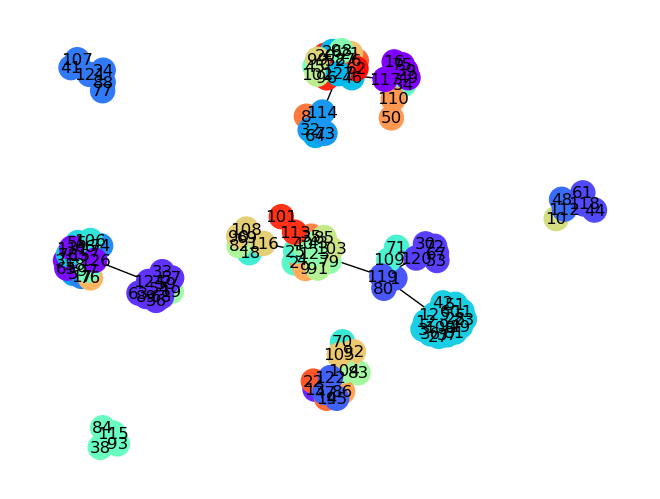

[[16, 117, 75, 49, 39], [31, 126, 58, 65, 111, 66], [15], [13], [57, 124, 63, 89, 33, 59, 56, 68], [120, 53, 67, 30, 72], [118, 44, 61], [1, 119, 80], [47, 122, 95], [48, 112], [41, 121, 77, 24, 88, 107], [17], [74], [73, 114, 32], [5], [64], [26, 127], [46], [78], [125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60, 29], [55], [7], [106], [70], [18], [71, 109], [25], [2], [34], [93, 115, 84, 38], [97], [45], [98], [43, 123, 40, 79], [54], [19], [104, 83], [82], [91], [102], [85], [103], [10], [99], [69, 116, 108, 90], [92, 105], [21], [76], [9], [86], [50, 110], [4], [35], [8], [14], [6], [22], [87], [0], [101, 113], [96], [20], [62], [52]]
i am in GCH ls
befor merge
0.5397513831022455


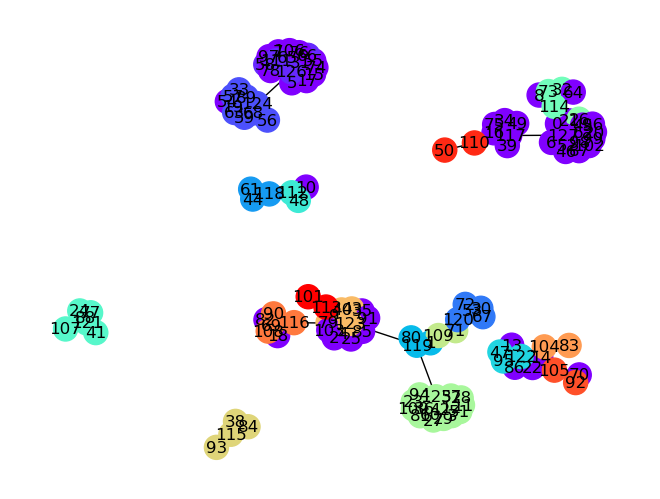

after merge
0.5714773581039528


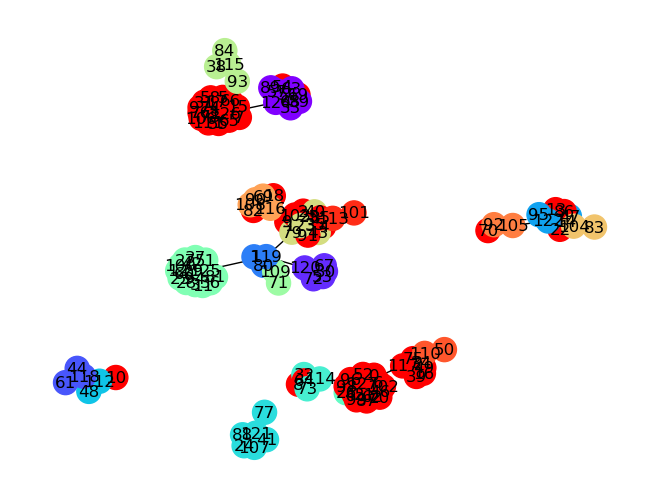

befor merge
0.5714773581039528


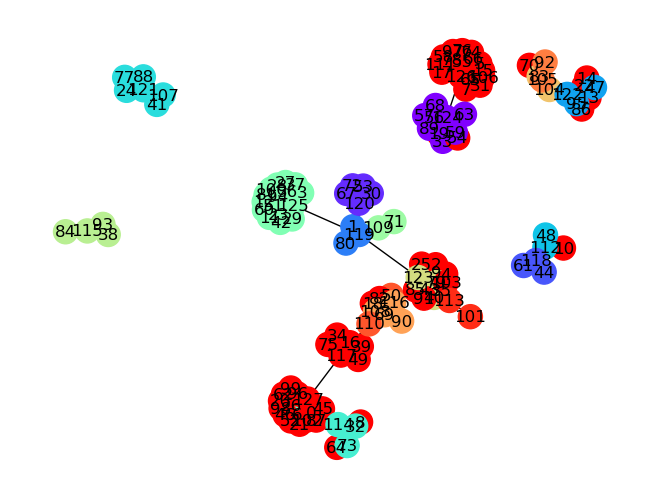

after merge
0.5772829724745561


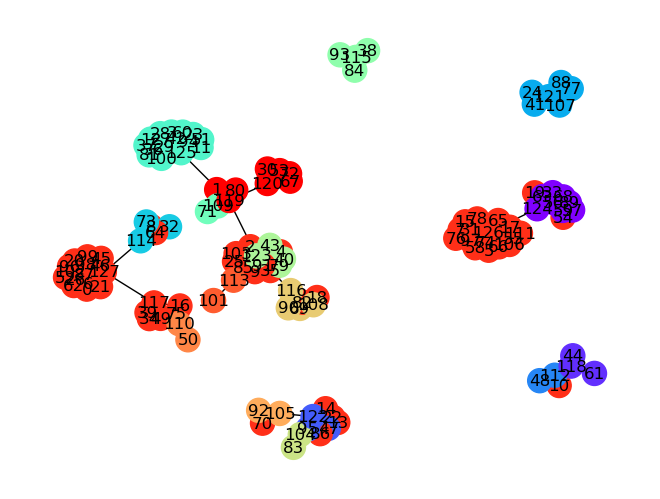

befor merge
0.5772829724745561


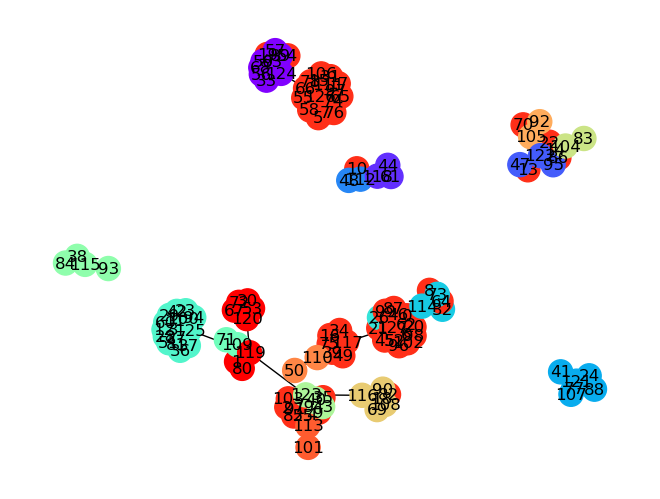

after merge
0.5848644218291084


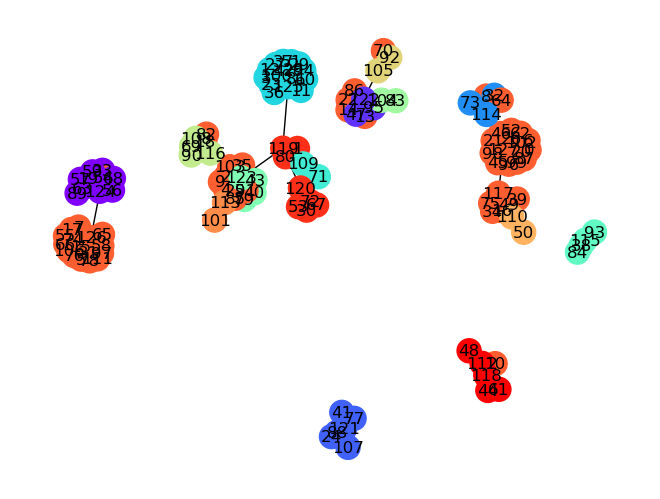

befor merge
0.5848644218291084


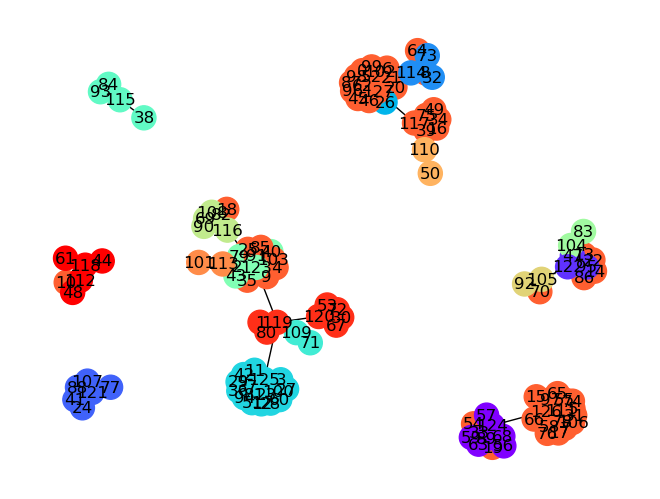

after merge
0.592104364455978


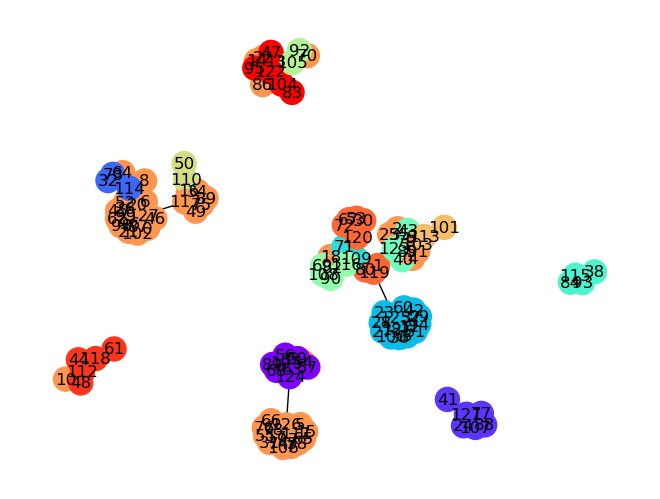

befor merge
0.592104364455978


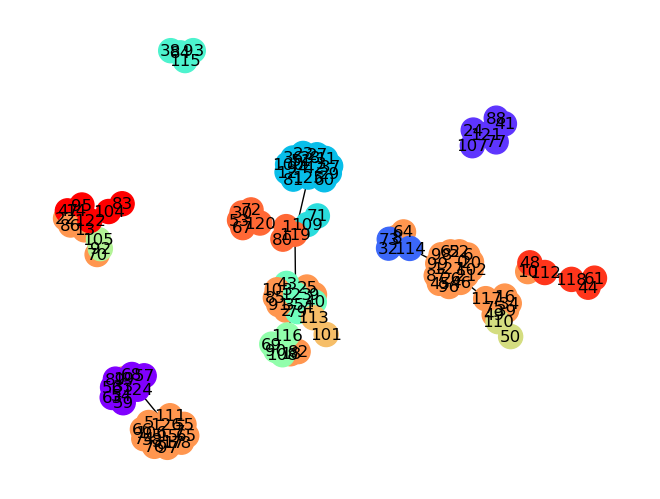

after merge
0.5949047196229745


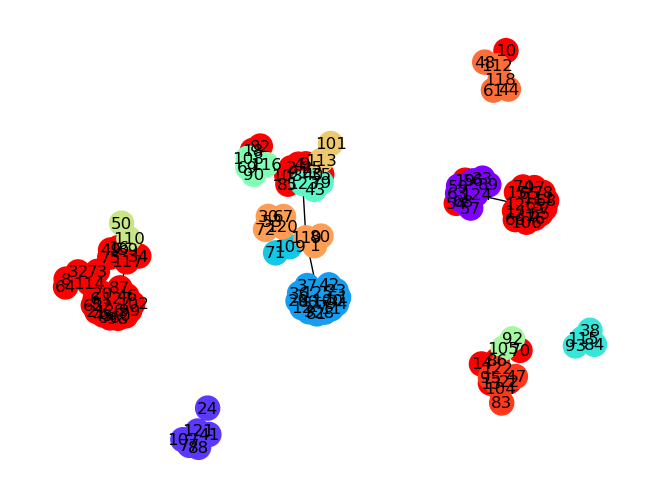

befor merge
0.5949047196229745


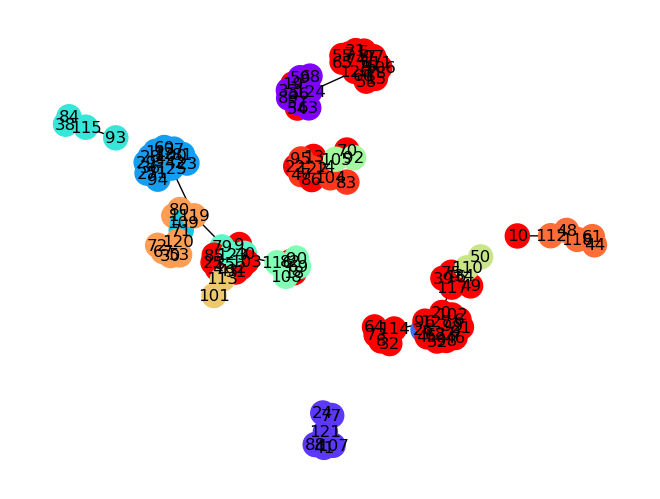

after merge
0.5997882658288348


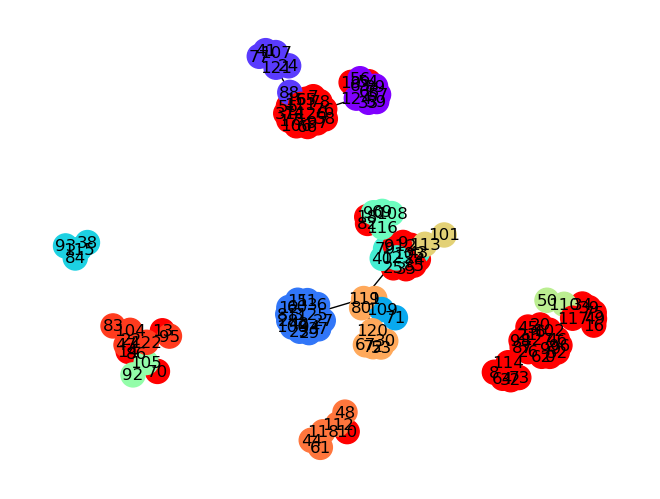

befor merge
0.5997882658288348


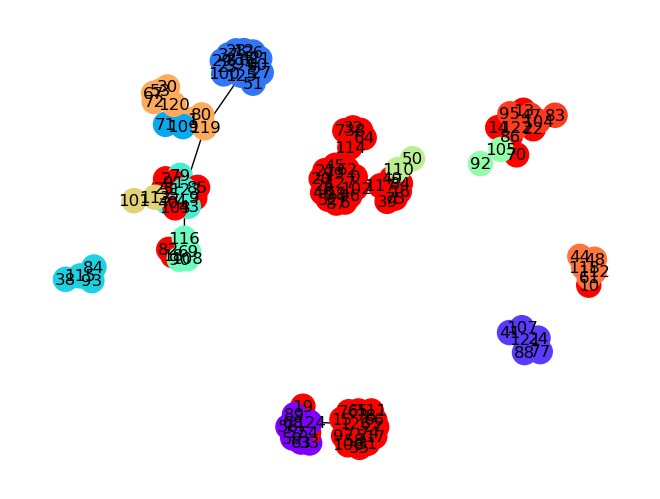

after merge
0.6063110443275713


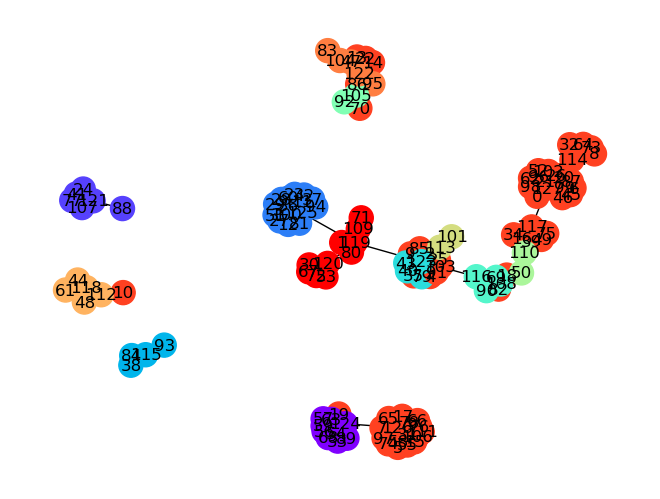

befor merge
0.6063110443275713


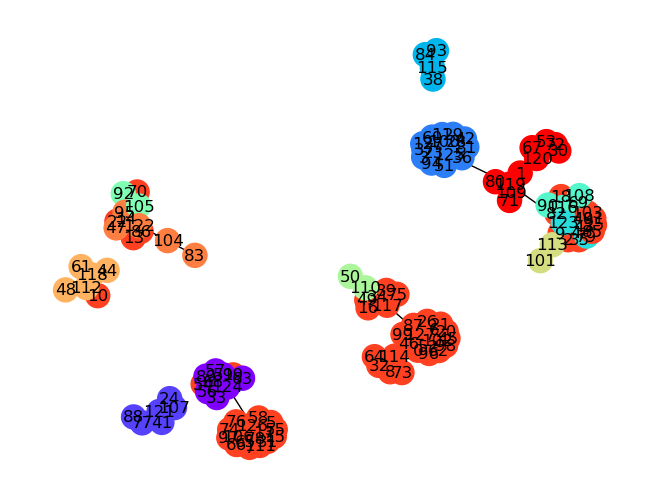

after merge
0.609350454203946


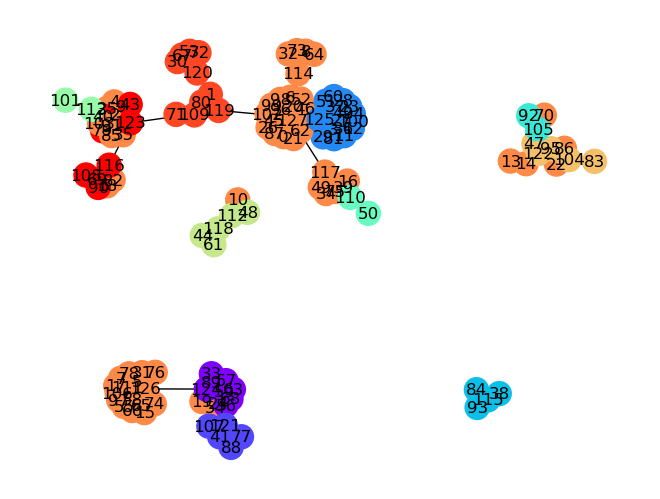

befor merge
0.609350454203946


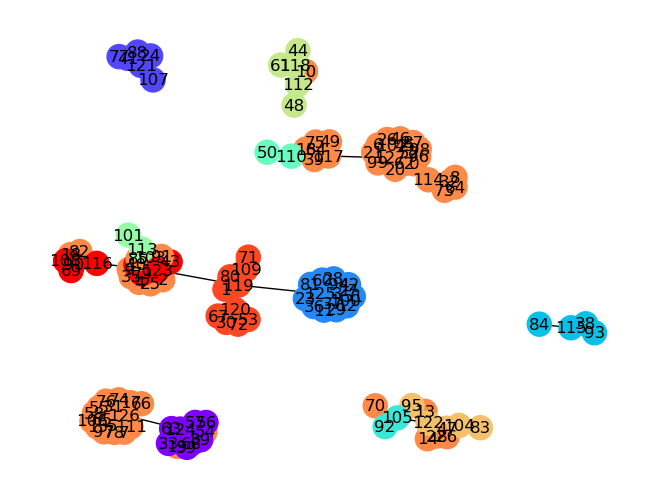

after merge
0.6158390820299141


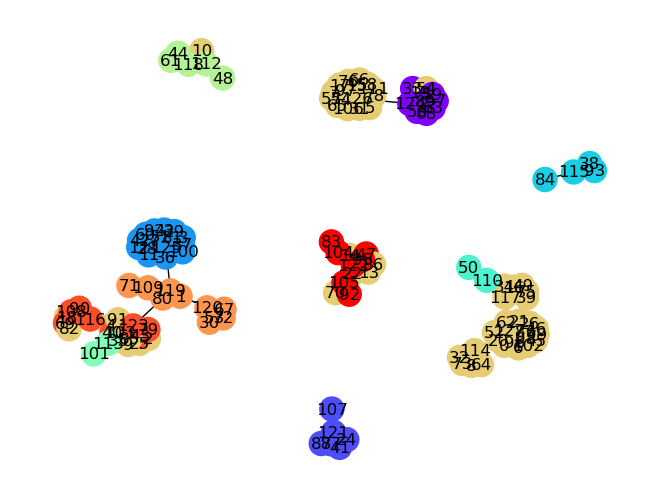

befor merge
0.6158390820299141


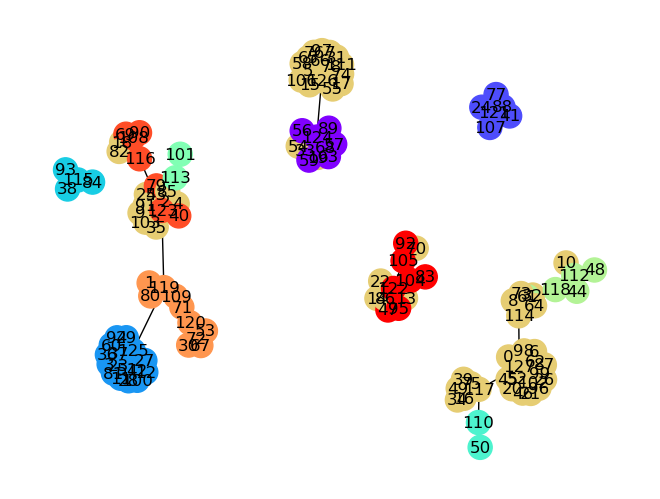

after merge
0.6214397923639076


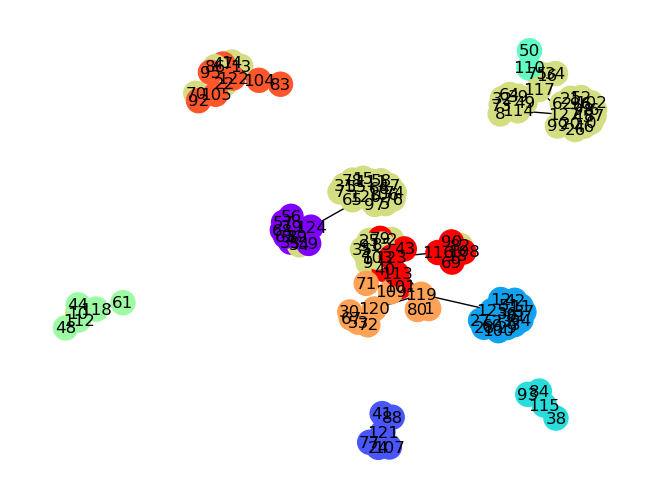

befor merge
0.7072262823577606


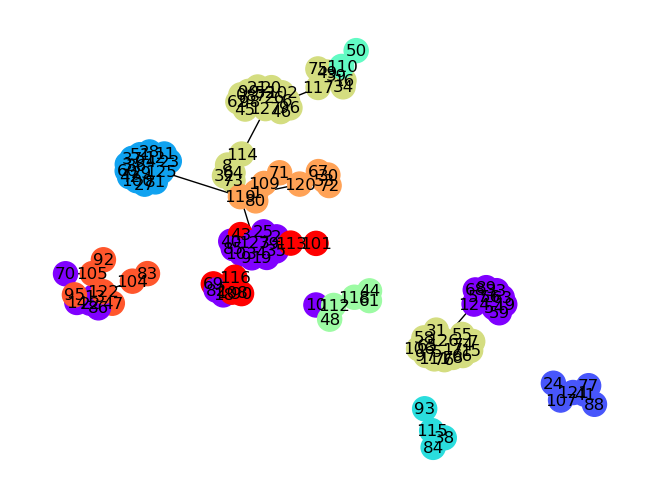

after merge
0.7189399631172729


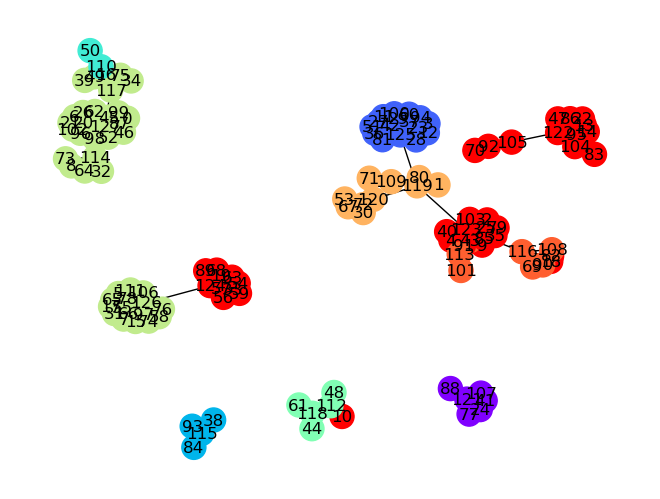

befor merge
0.7189399631172729


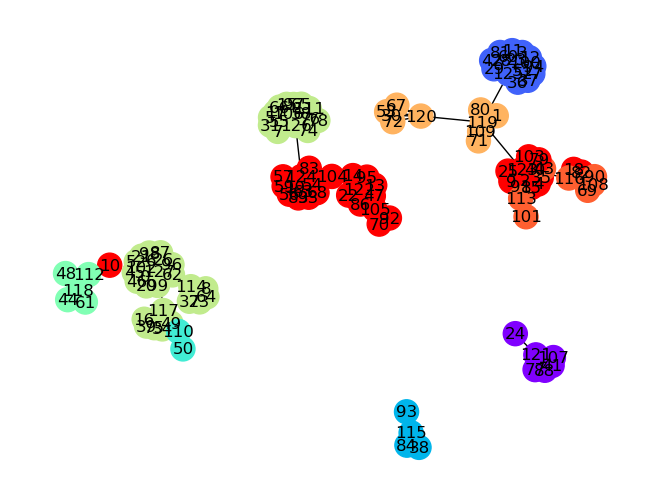

after merge
0.7300730824397244


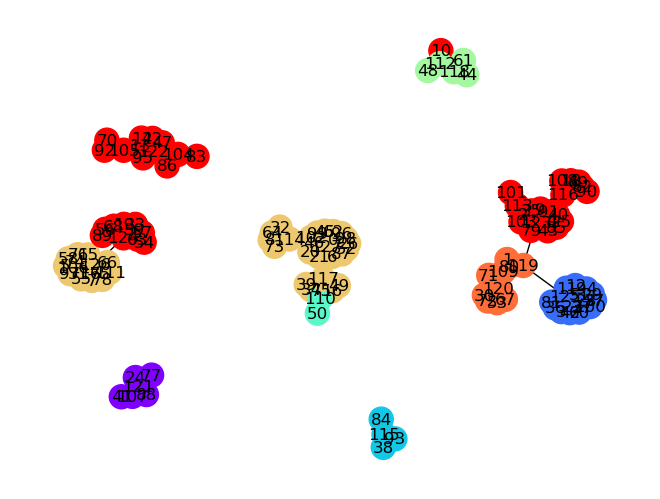

befor merge
0.7324636295335026


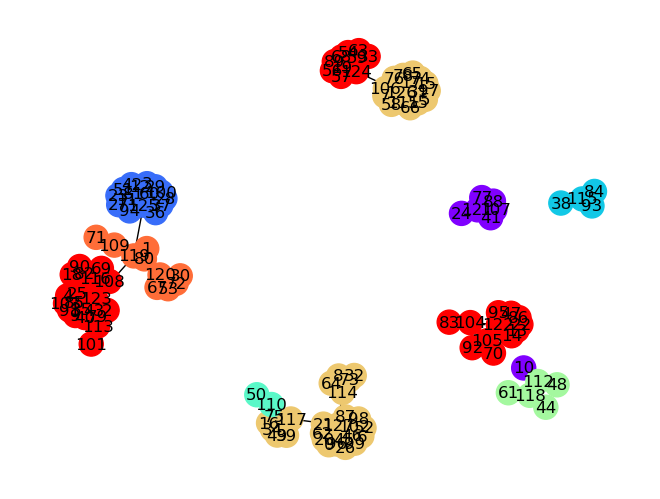

after merge
0.737347175739363


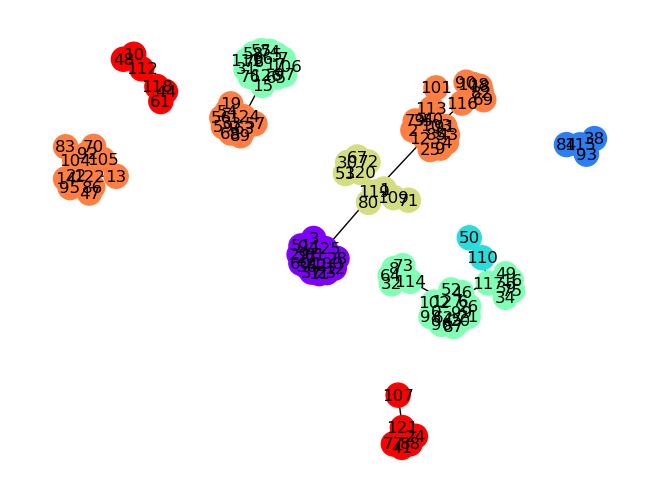

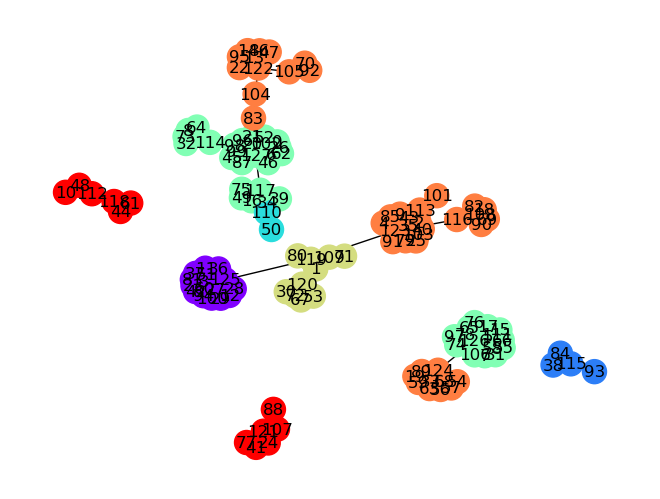

i am in best 1 [[125, 3, 23, 12, 100, 81, 28, 36, 37, 94, 27, 51, 11, 42, 60, 29], [93, 115, 84, 38], [50, 110], [26, 73, 114, 32, 16, 117, 75, 49, 39, 6, 17, 46, 52, 99, 106, 74, 20, 87, 102, 62, 45, 0, 76, 15, 98, 78, 55, 7, 127, 34, 8, 96, 97, 5, 64, 21, 31, 126, 58, 65, 111, 66], [71, 109, 120, 53, 67, 30, 72, 1, 119, 80], [101, 113, 43, 69, 116, 108, 90, 57, 124, 63, 89, 33, 59, 56, 68, 22, 70, 35, 85, 82, 19, 103, 14, 4, 2, 25, 91, 18, 13, 54, 9, 86, 123, 40, 79, 92, 105, 47, 122, 95, 104, 83], [41, 121, 77, 24, 88, 107, 10, 118, 44, 61, 48, 112]]


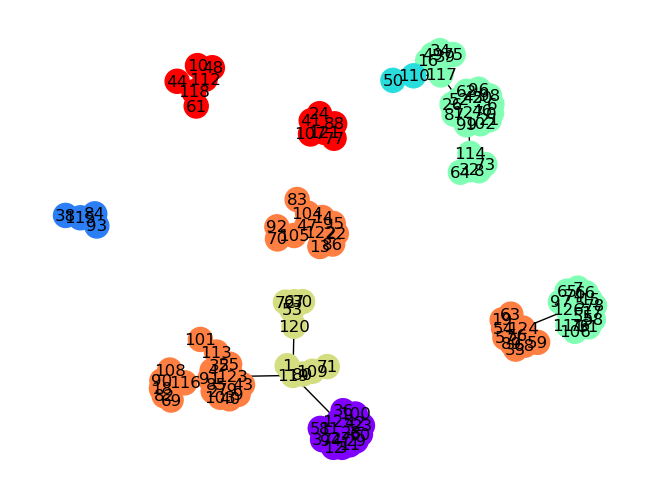

first modularity
0.737347175739363
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 123 from Community 5 to Community 4
Moving node 119 from Community 4 to Community 0
i am in ls
befor merge
0.710299842906905


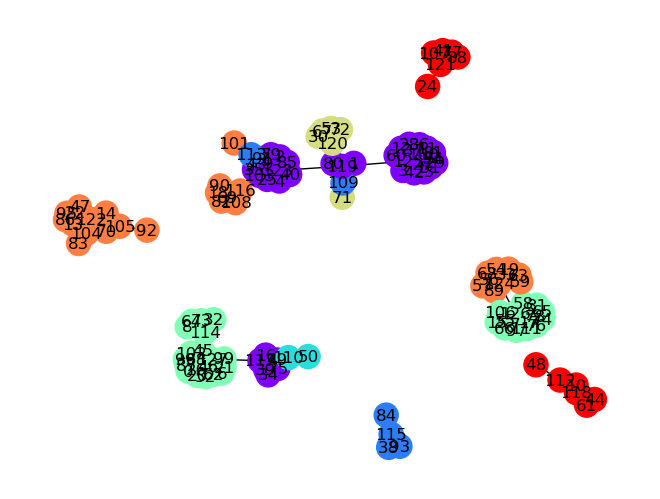

after merge
0.7107779523256599


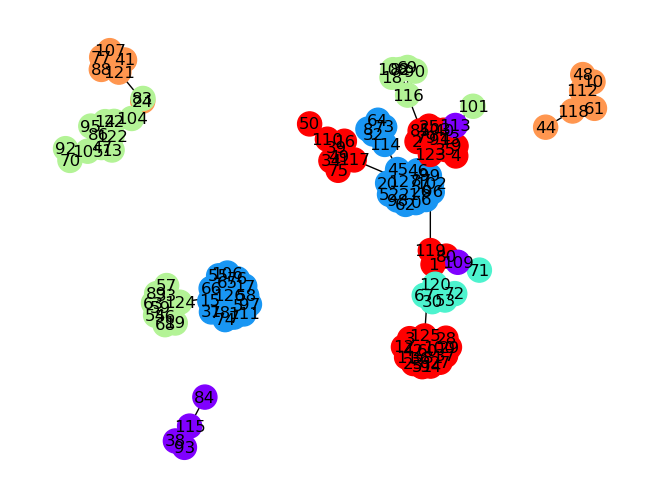

befor merge
0.7107779523256599


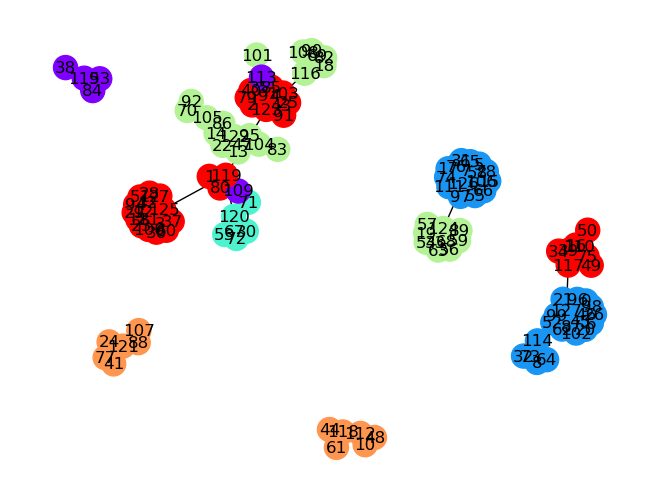

after merge
0.7156273478587521


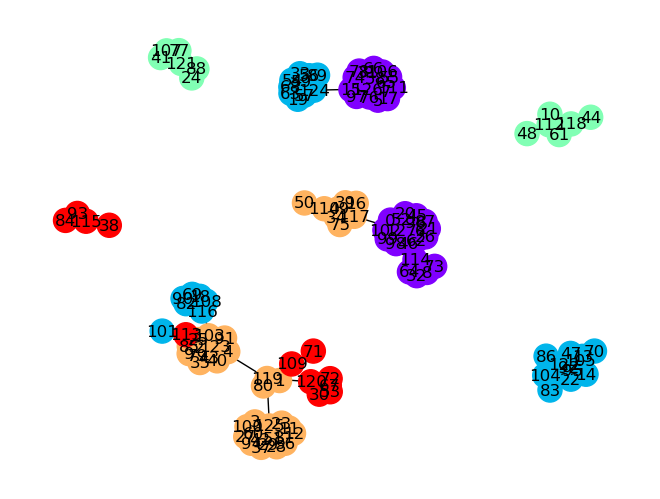

i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 125 from Community 0 to Community 4
Moving node 110 from Community 2 to Community 3
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 110 from Community 2 to Community 3
Moving node 124 from Community 5 to Community 3
Moving node 125 from Community 0 to Community 4
i am in ls
befor merge
0.6899460419370237


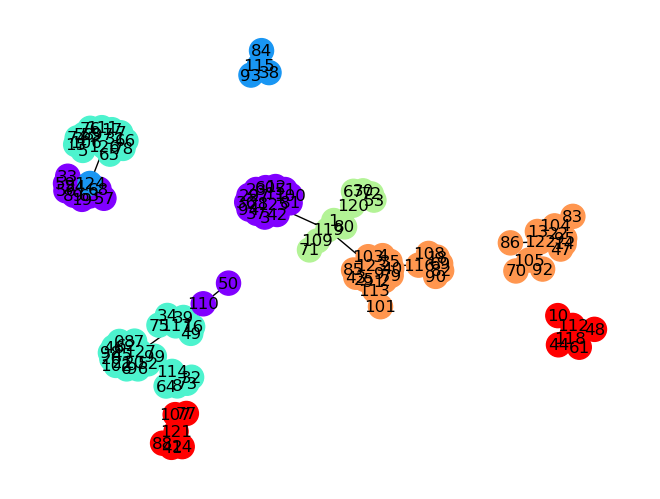

after merge
0.7408305443617244


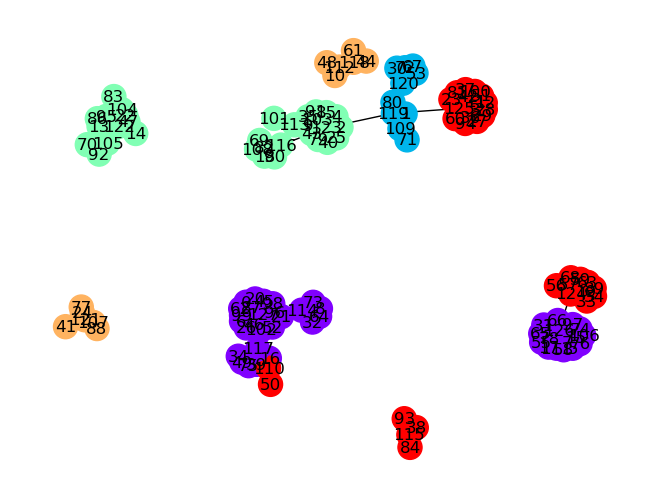

i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 117 from Community 3 to Community 2
Moving node 119 from Community 4 to Community 5
i am in ls
befor merge
0.728331398128544


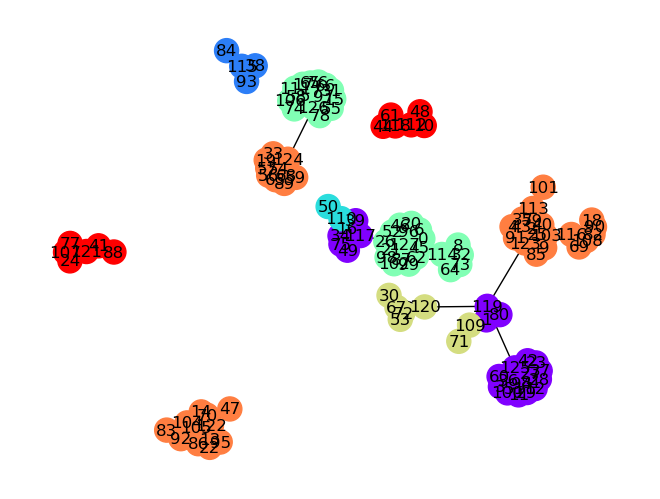

after merge
0.7313708080049184


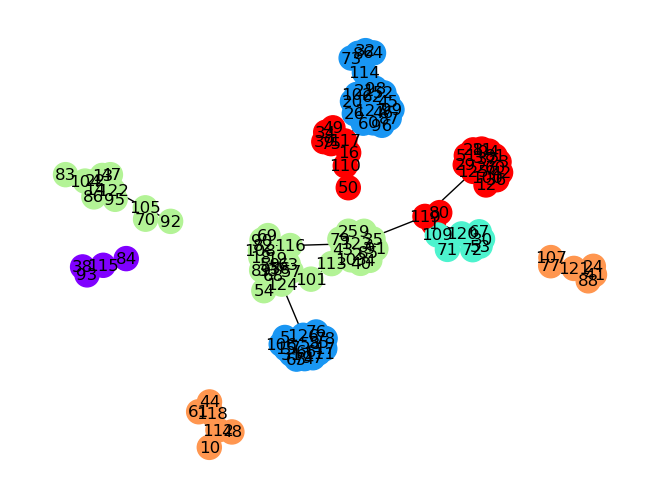

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 110 from Community 2 to Community 3
No suitable community found for moving node 126
i am in ls
befor merge
0.6899460419370237


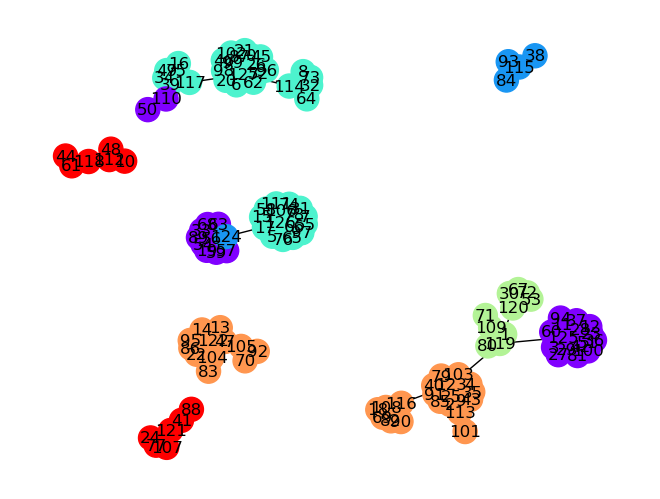

after merge
0.7408305443617244


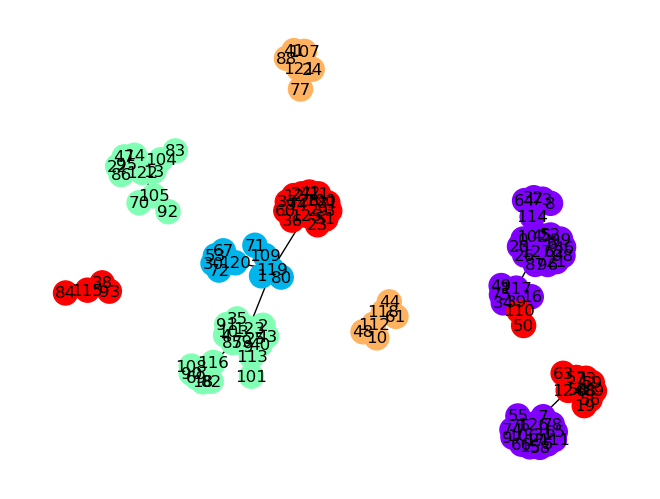

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
No suitable community found for moving node 126
Moving node 110 from Community 2 to Community 3
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.6284065296086299


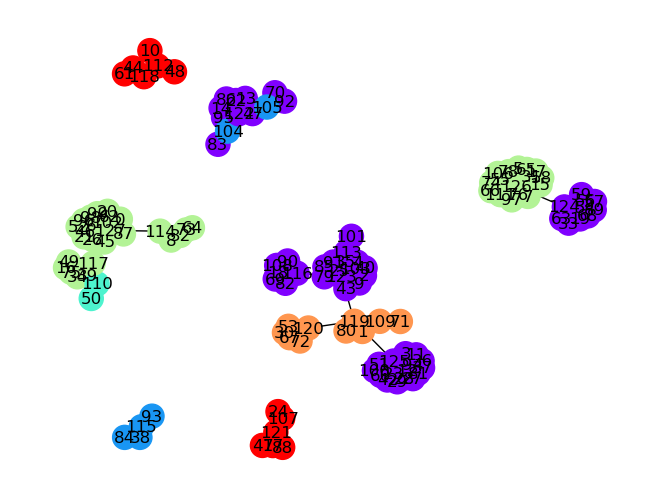

after merge
0.6299091592104319


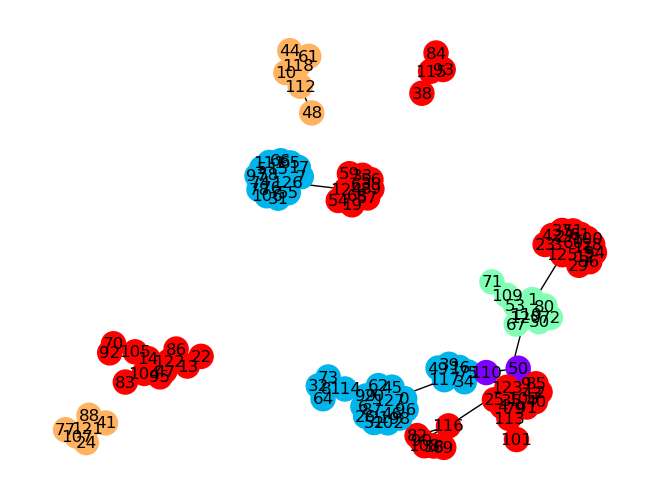

i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
No suitable community found for moving node 126
Moving node 119 from Community 4 to Community 0
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.7093777747421623


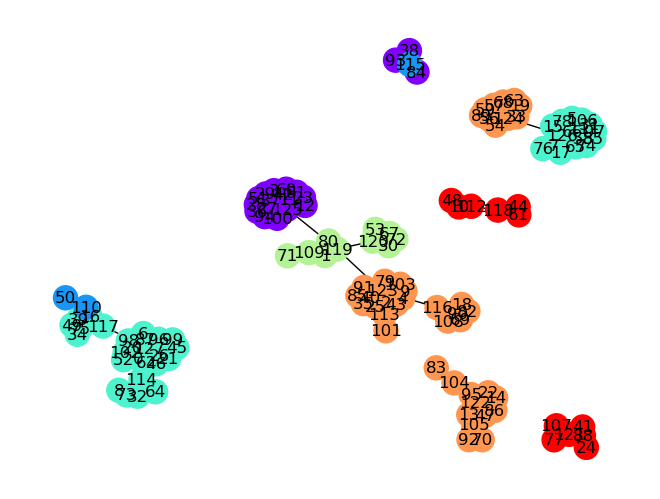

after merge
0.7272044259271915


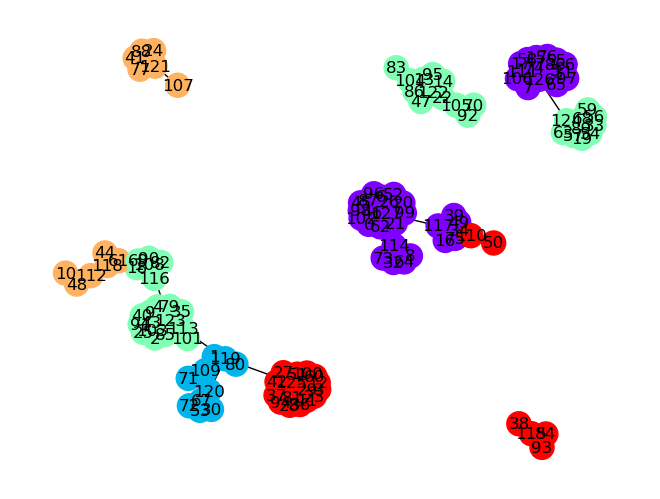

i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 110 from Community 2 to Community 3
Moving node 119 from Community 4 to Community 5
i am in ls
befor merge
0.711904924527013


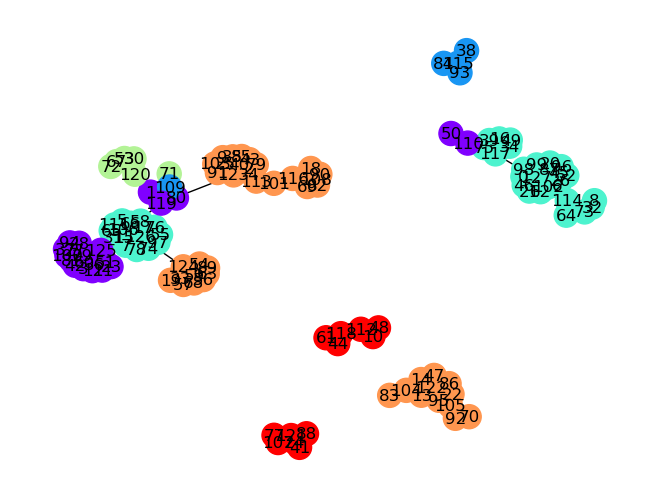

after merge
0.7174373335154707


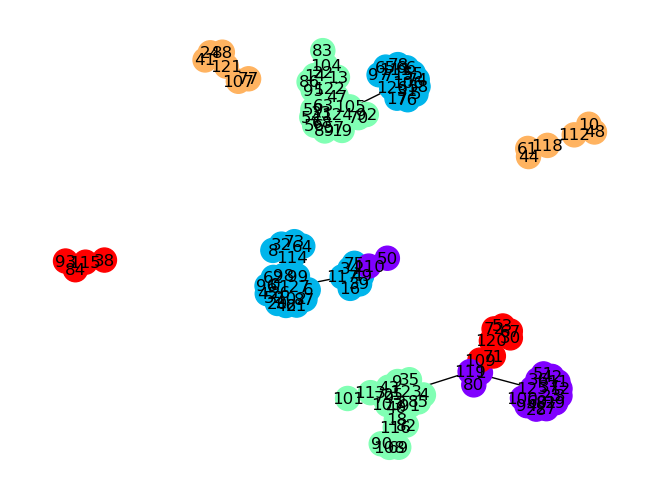

i am in ac
i am in permutation
i am in ls
befor merge
0.7108462536711966


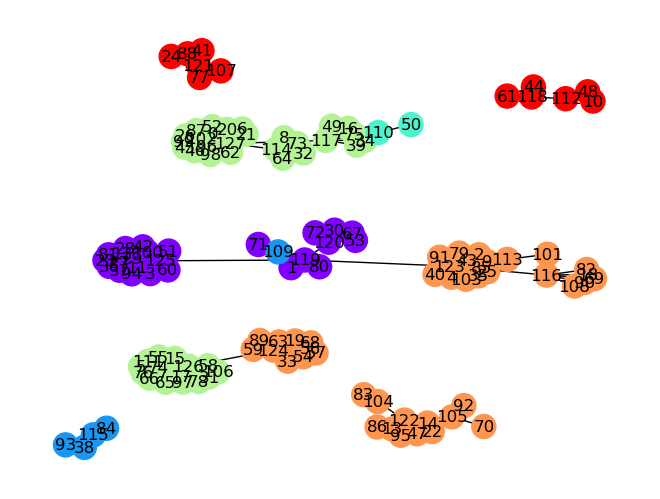

after merge
0.7139881155658758


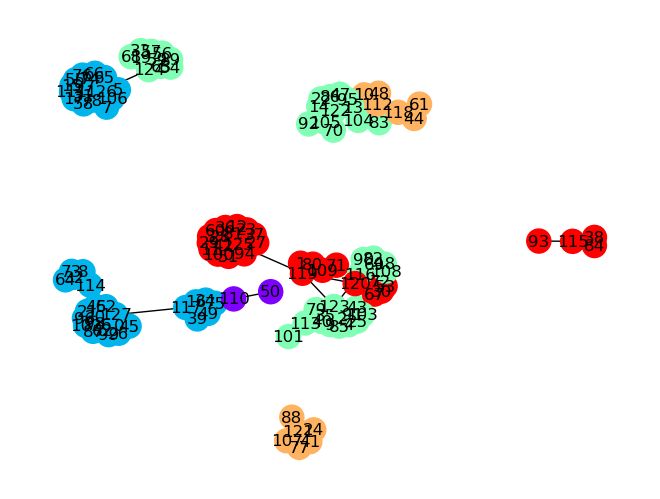

i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 119 from Community 4 to Community 0
Moving node 124 from Community 5 to Community 3
i am in ls
befor merge
0.7219110716481119


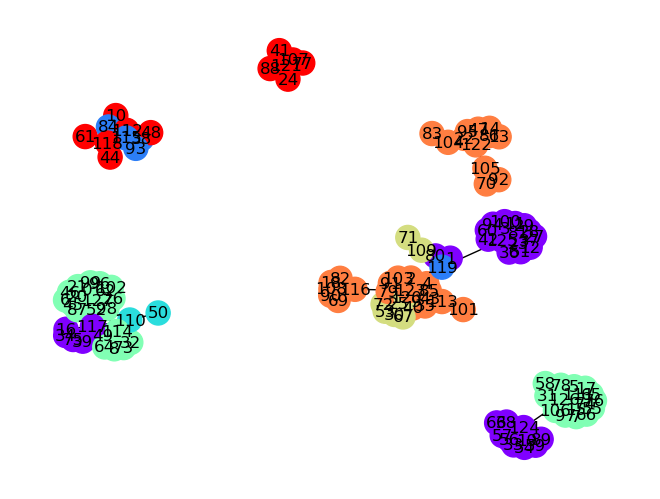

after merge
0.7236186052865236


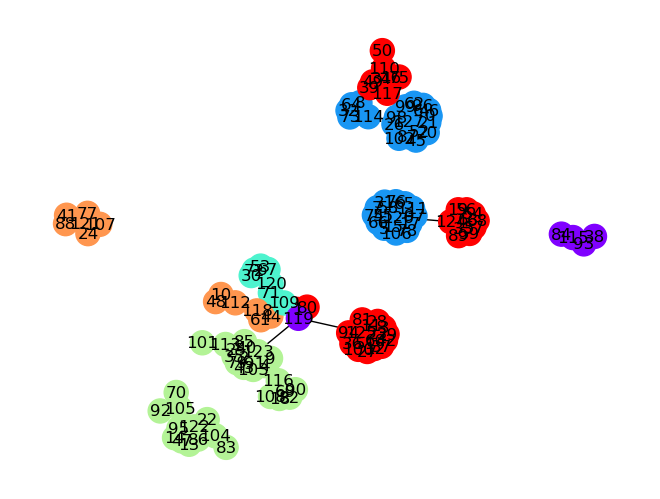

befor merge
0.7236186052865236


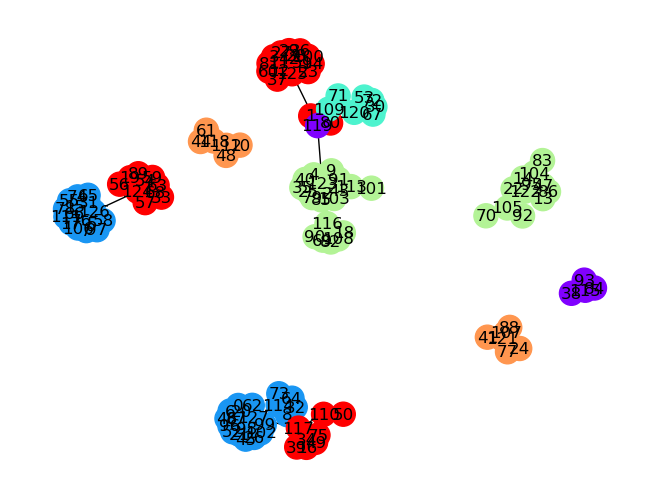

after merge
0.7352298340277298


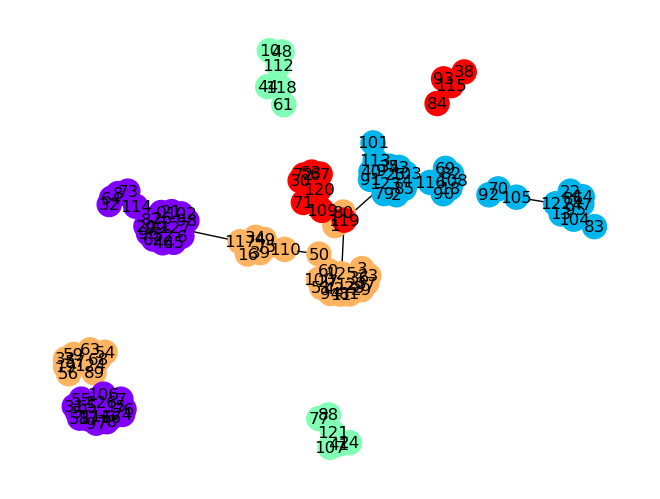

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 125 from Community 0 to Community 4
Moving node 117 from Community 3 to Community 2
i am in ls
befor merge
0.7567447578717313


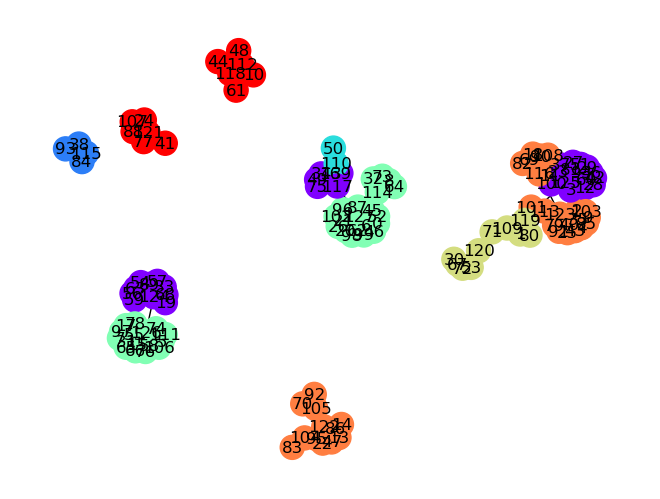

after merge
0.7586571955467527


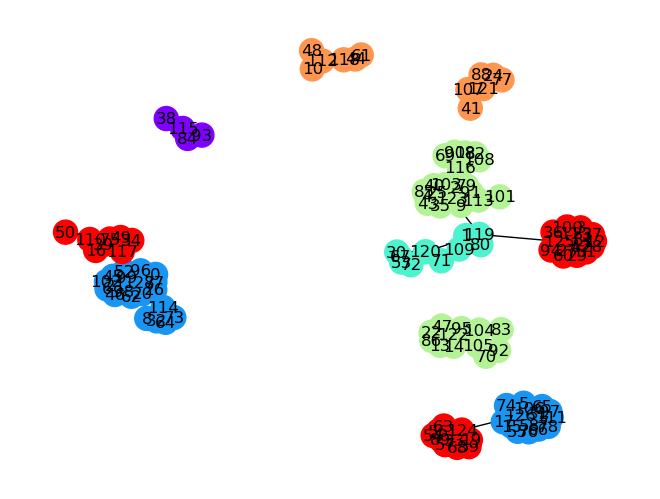

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 110 from Community 2 to Community 3
Moving node 125 from Community 0 to Community 4
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
No suitable community found for moving node 110
Moving node 123 from Community 5 to Community 4
i am in ls
befor merge
0.7337272044259275


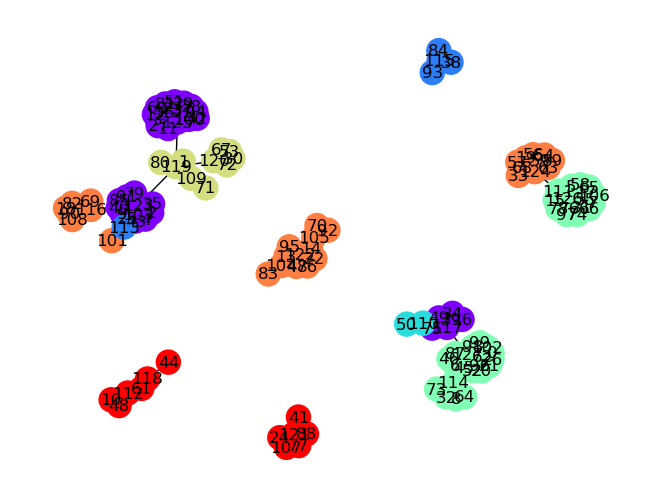

after merge
0.7350249299911209


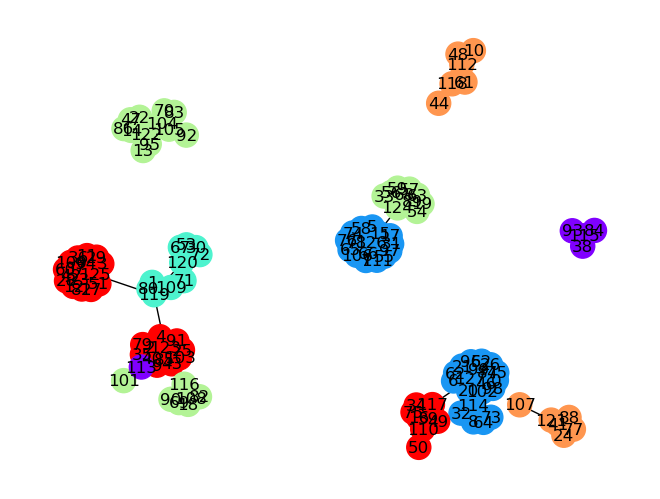

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 123 from Community 5 to Community 4
Moving node 124 from Community 5 to Community 3
i am in ls
befor merge
0.5904992828358671


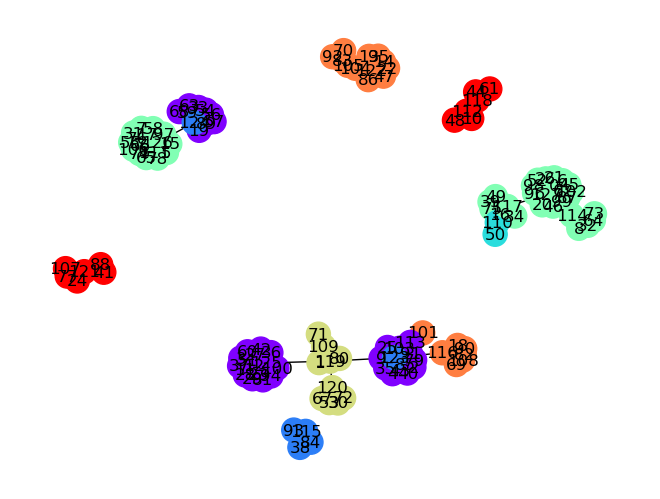

after merge
0.7097534321426129


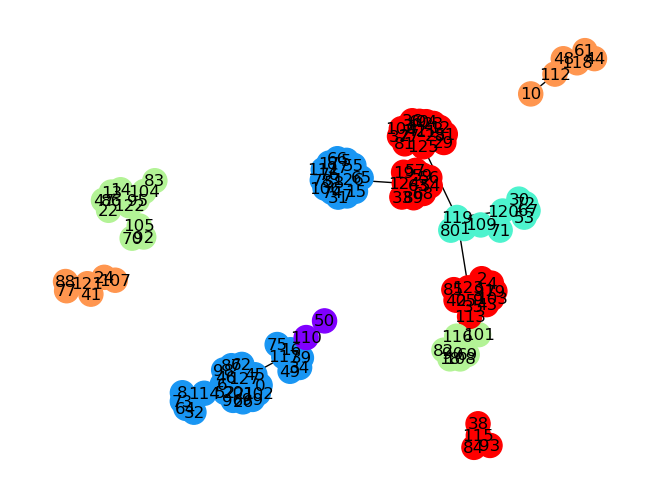

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 125 from Community 0 to Community 4
Moving node 123 from Community 5 to Community 4
i am in ls
befor merge
0.6675090499282808


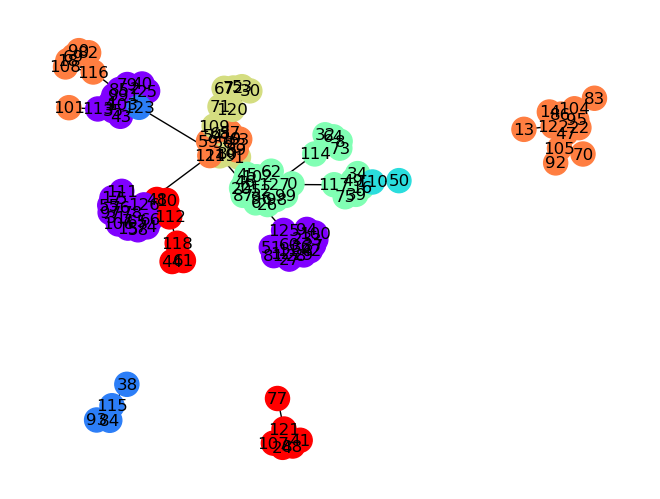

after merge
0.7154565944949117


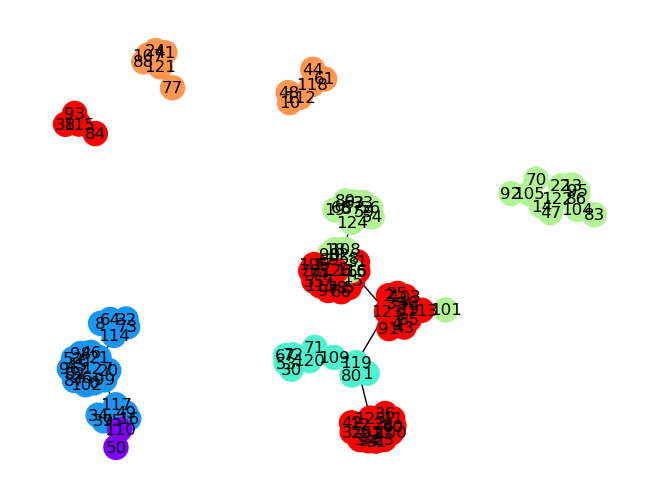

befor merge
0.7154565944949117


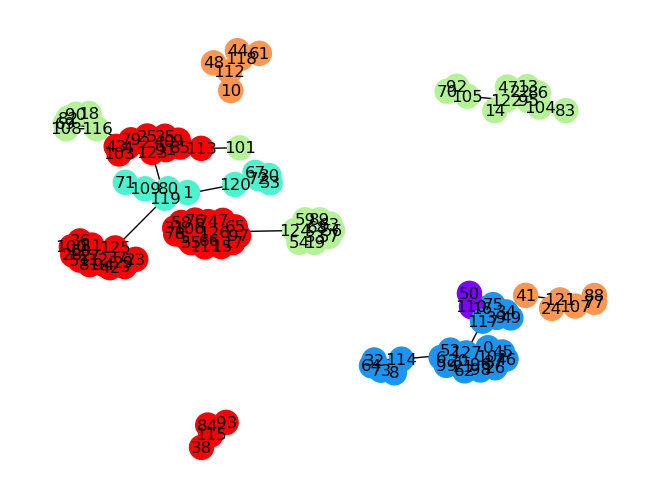

after merge
0.7184960043712856


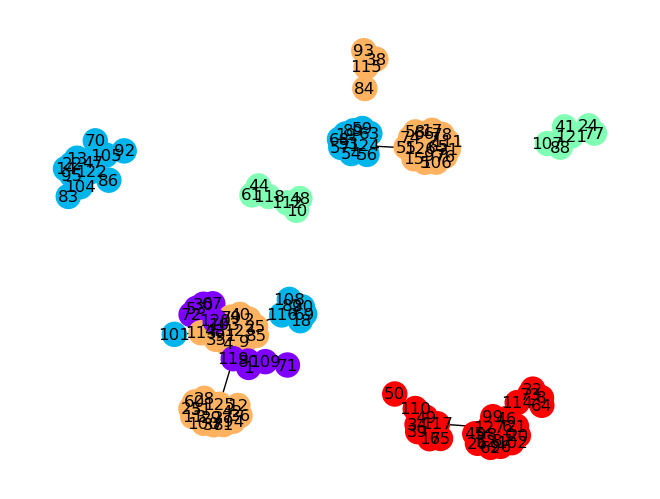

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 123 from Community 5 to Community 4
Moving node 126 from Community 3 to Community 5
Moving node 117 from Community 3 to Community 2
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 110 from Community 2 to Community 3
Moving node 123 from Community 5 to Community 4
i am in ls
i am in ac
i am in permutation
Moving node 123 from Community 5 to Community 4
Moving node 124 from Community 5 to Community 3
Moving node 117 from Community 3 to Community 2
i am in ls
i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 123 from Community 5 to Community 4
Moving node 119 from Community 4 to Community 0
i am in ls
befor merge
0.710299842906905


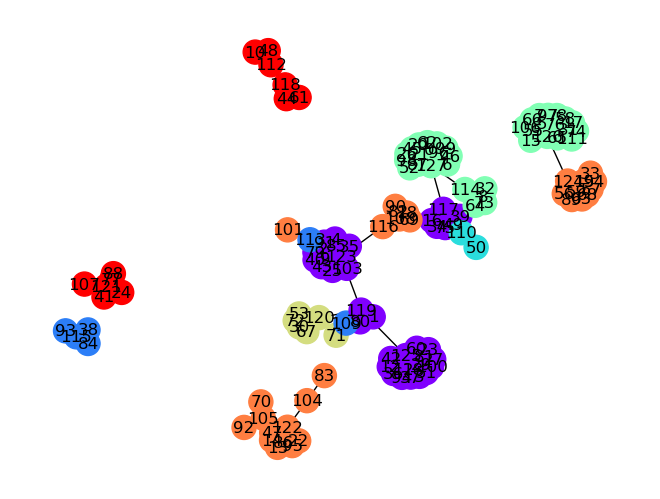

after merge
0.7107779523256599


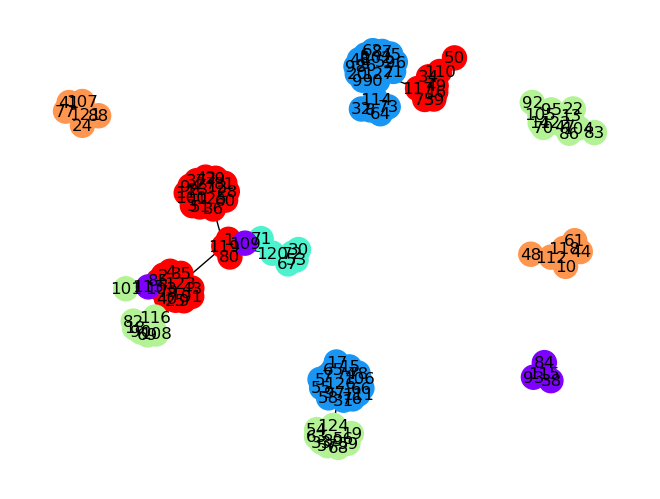

befor merge
0.7107779523256599


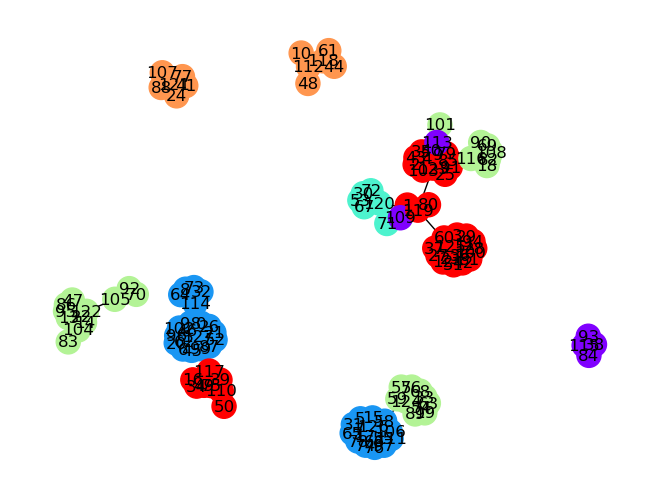

after merge
0.7156273478587521


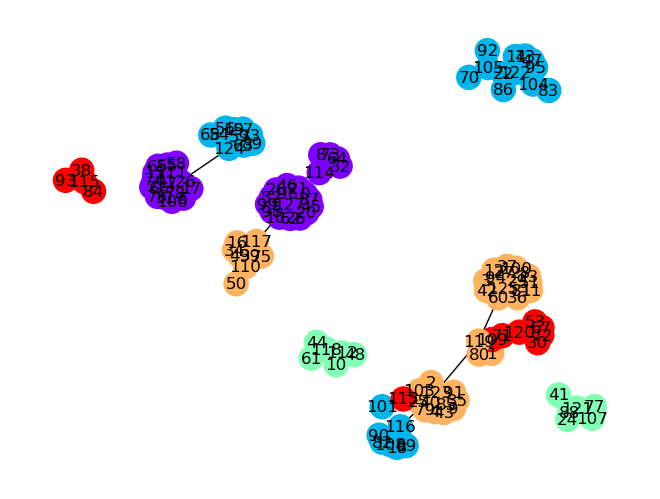

i am in ac
i am in permutation
Moving node 123 from Community 5 to Community 4
Moving node 126 from Community 3 to Community 5
No suitable community found for moving node 124
i am in ls
befor merge
0.6675090499282808


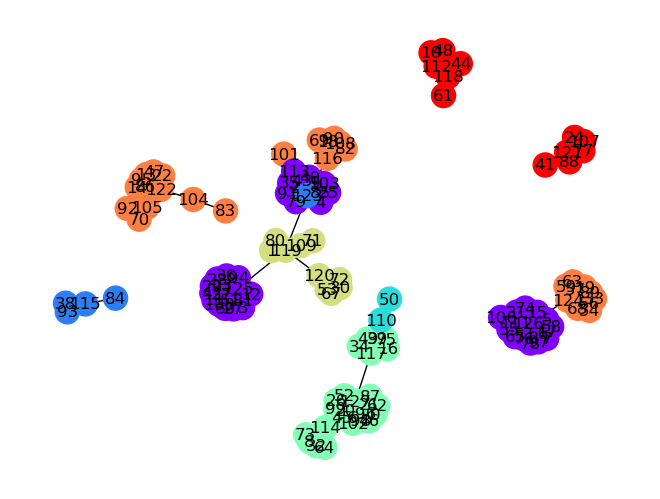

after merge
0.7154565944949117


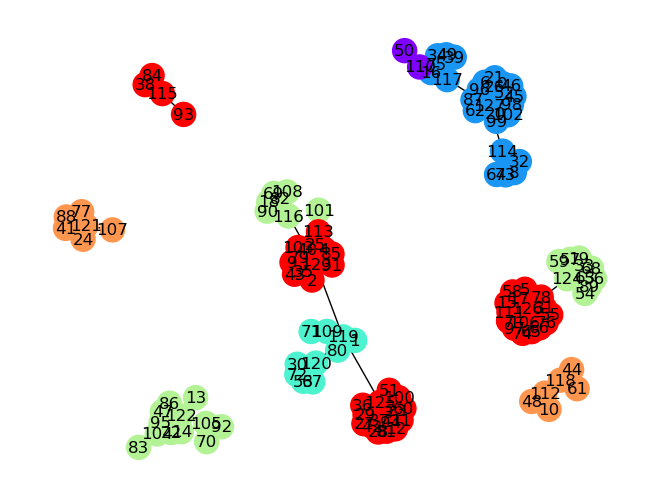

befor merge
0.7154565944949117


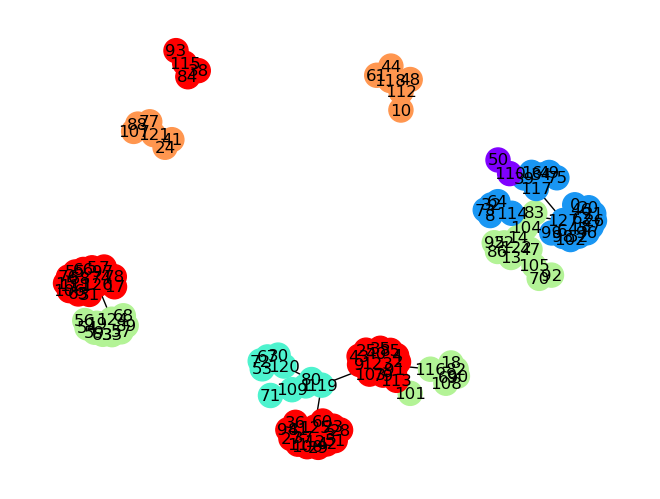

after merge
0.7184960043712856


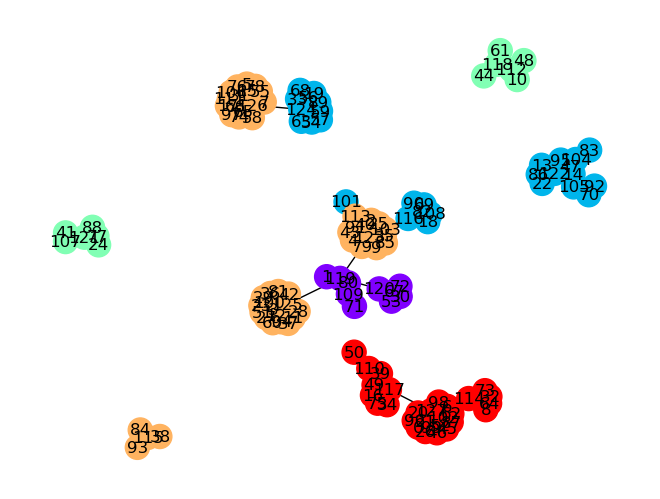

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 125 from Community 0 to Community 4
No suitable community found for moving node 124
i am in ls
befor merge
0.75852059285568


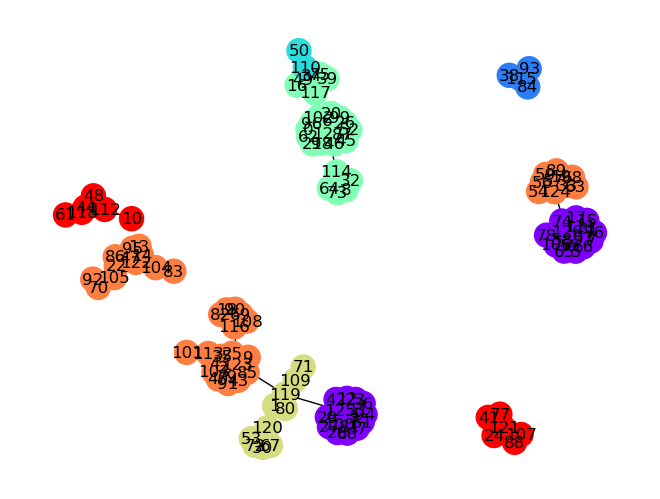

after merge
0.7615600027320543


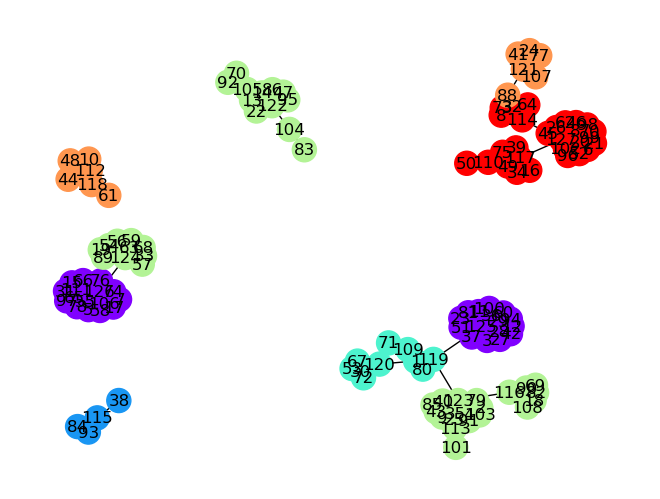

i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 125 from Community 0 to Community 4
Moving node 119 from Community 4 to Community 5
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 123 from Community 5 to Community 4
Moving node 110 from Community 2 to Community 3
Moving node 125 from Community 0 to Community 4
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 119 from Community 4 to Community 5
Moving node 126 from Community 3 to Community 5
Moving node 110 from Community 2 to Community 3
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 123 from Community 5 to Community 4
Moving node 110 from Community 2 to Community 3
No suitable community found for moving node 117
i am in ls
befor merge
0.6555904651321603


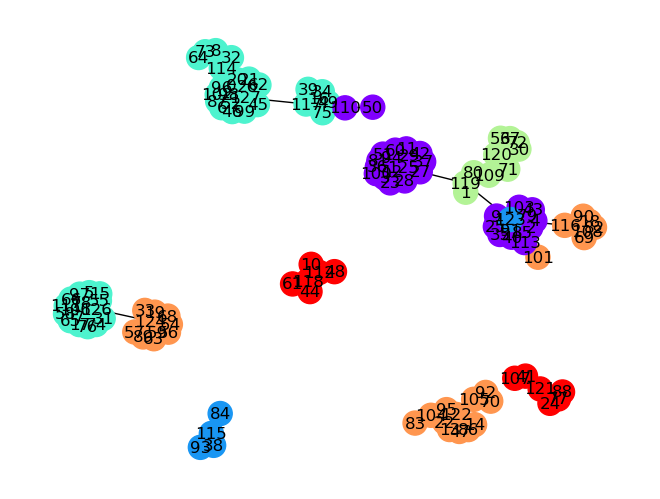

after merge
0.7226623864490128


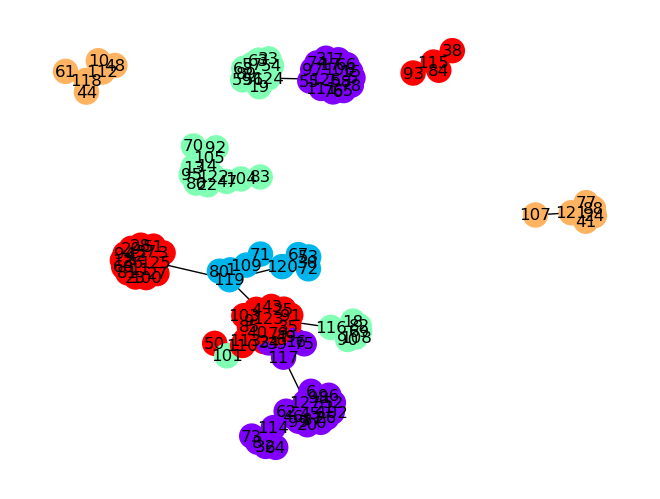

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 110 from Community 2 to Community 3
No suitable community found for moving node 117
Moving node 123 from Community 5 to Community 4
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.7108462536711966


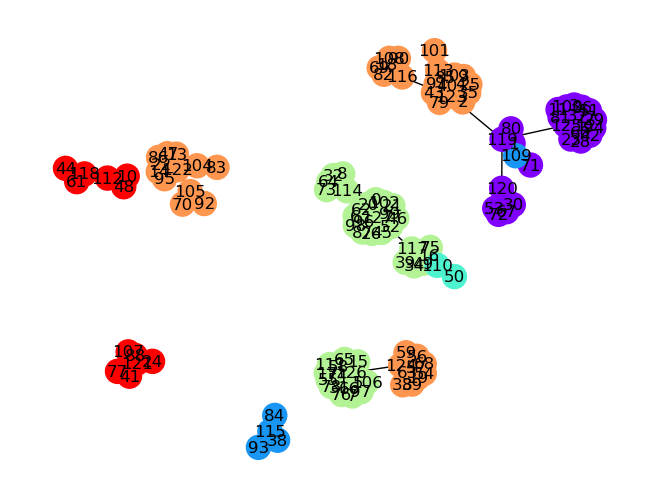

after merge
0.7139881155658758


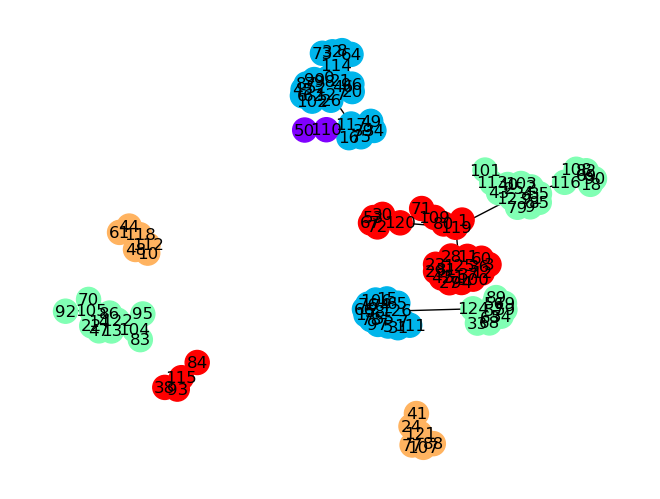

i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 119 from Community 4 to Community 0
Moving node 126 from Community 3 to Community 5
i am in ls
befor merge
0.7051772419916663


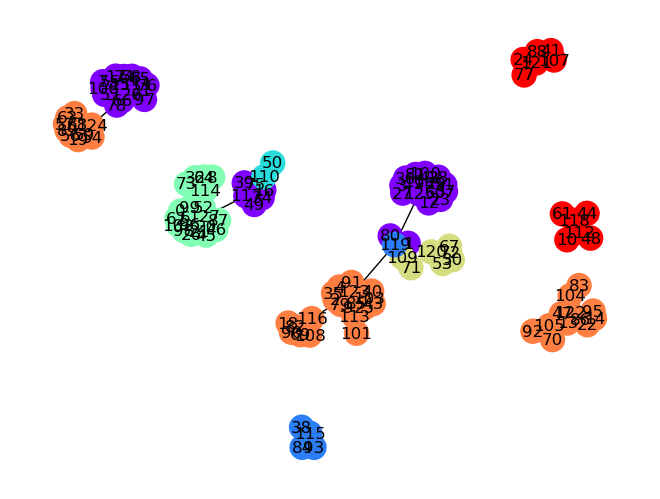

after merge
0.7056553514104211


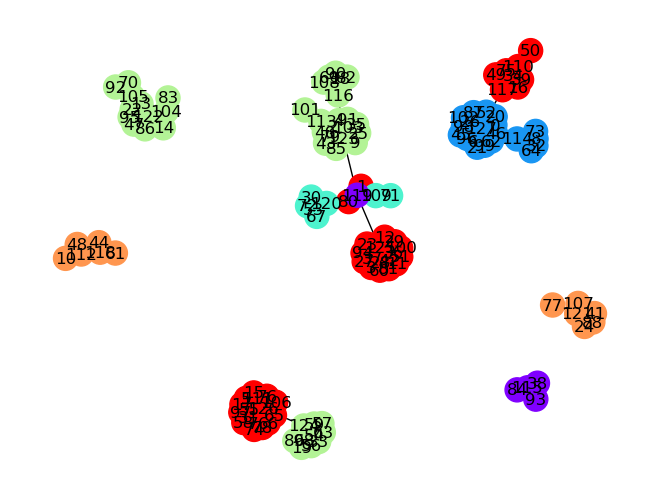

befor merge
0.7056553514104211


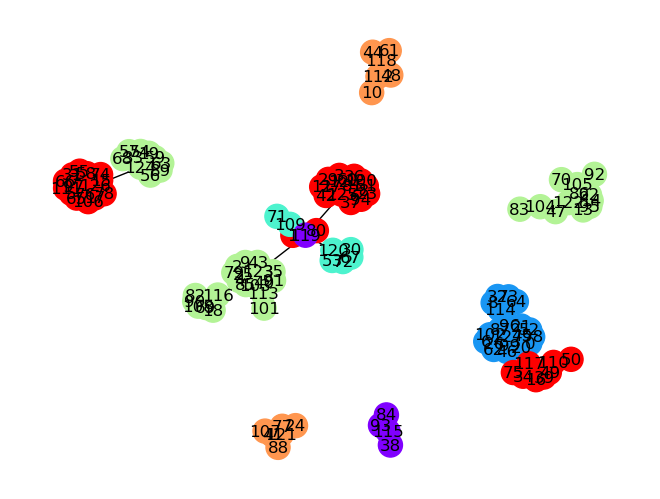

after merge
0.7172665801516274


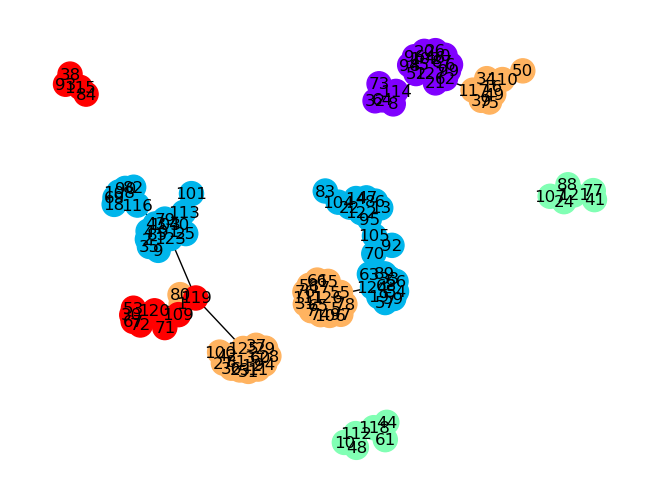

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 126 from Community 3 to Community 5
No suitable community found for moving node 124
i am in ls
befor merge
0.7408305443617242


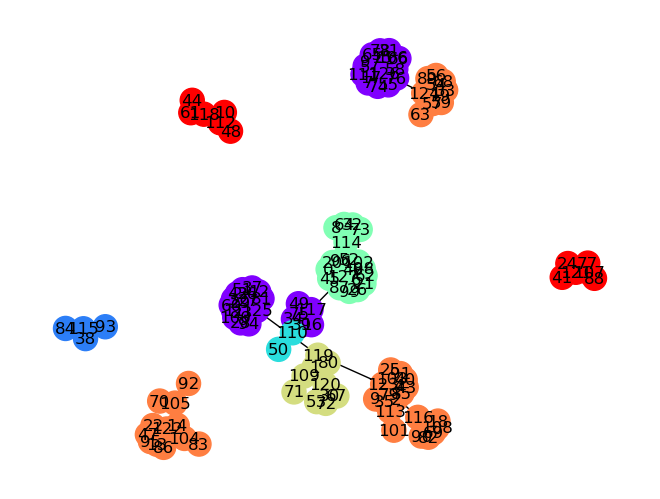

after merge
0.7415135578170889


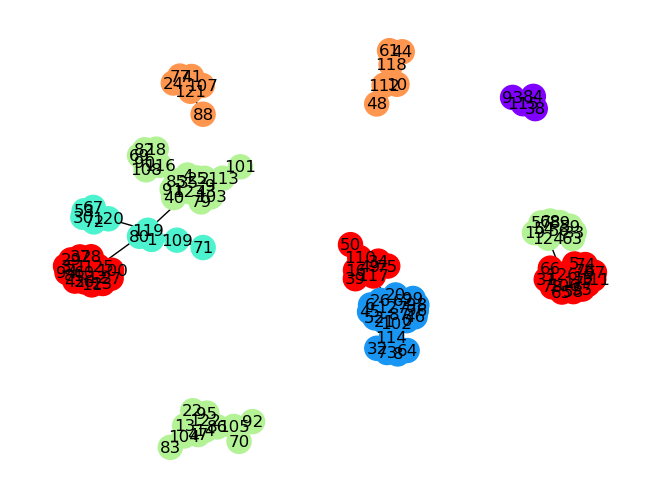

i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 123 from Community 5 to Community 4
Moving node 124 from Community 5 to Community 3
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.7108462536711966


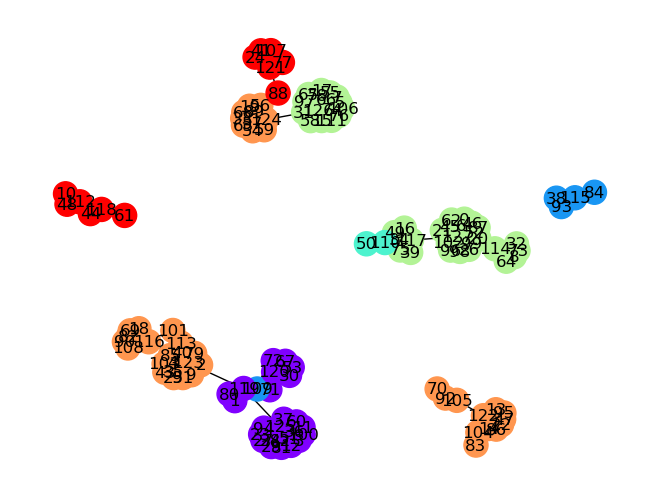

after merge
0.7139881155658758


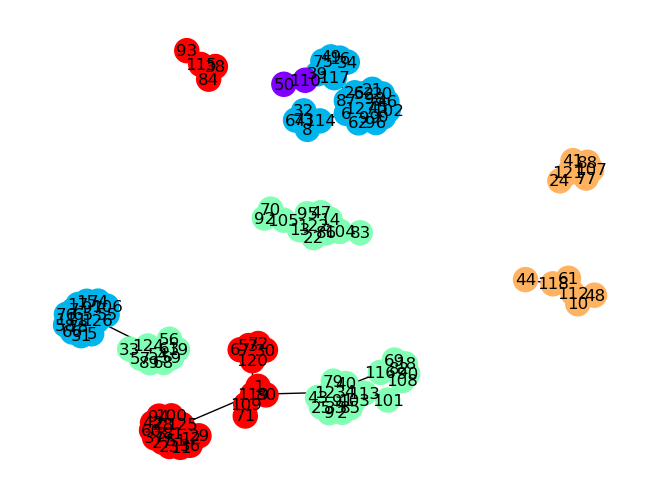

i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 119 from Community 4 to Community 0
Moving node 123 from Community 5 to Community 0
i am in ls
befor merge
0.7104705962707459


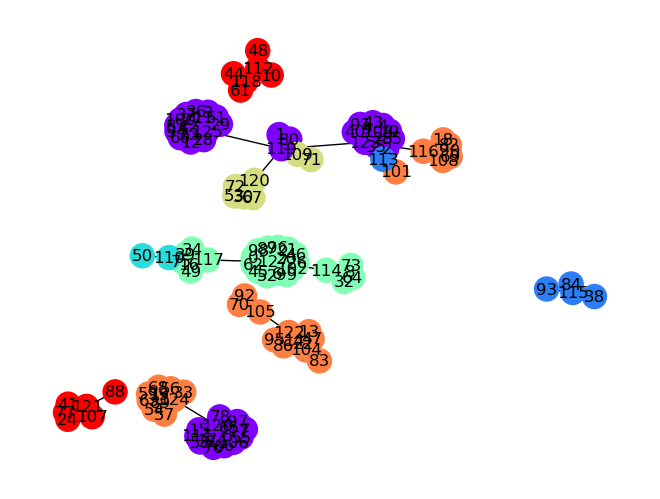

after merge
0.7135100061471197


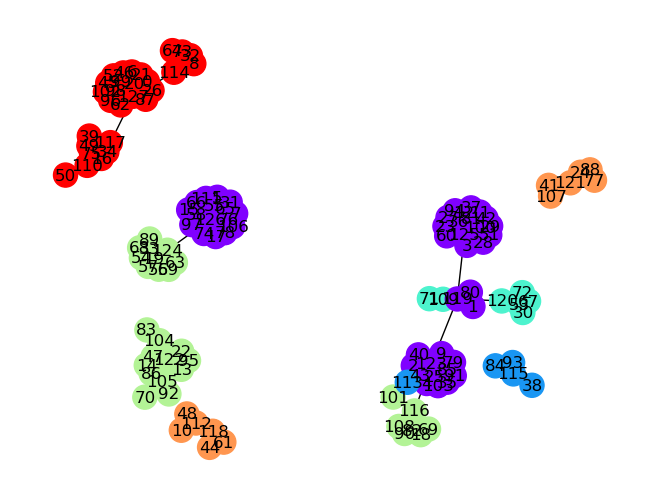

i am in ac
i am in permutation
Moving node 119 from Community 4 to Community 5
Moving node 110 from Community 2 to Community 3
No suitable community found for moving node 117
i am in ls
i am in ac
i am in permutation
Moving node 119 from Community 4 to Community 5
Moving node 124 from Community 5 to Community 3
No suitable community found for moving node 123
i am in ls
befor merge
0.678129909159208


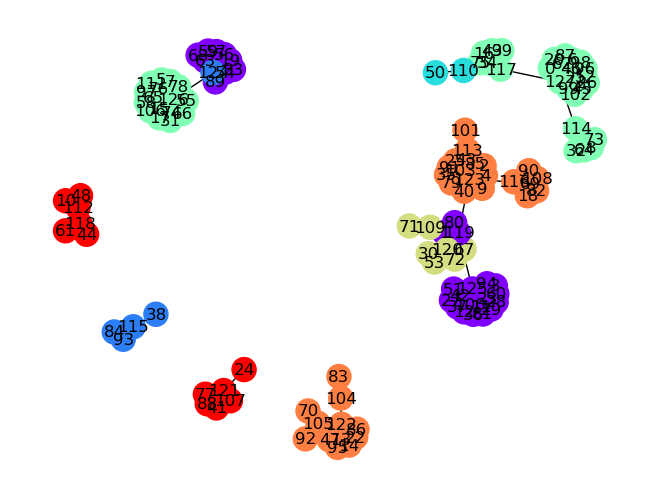

after merge
0.726282357762448


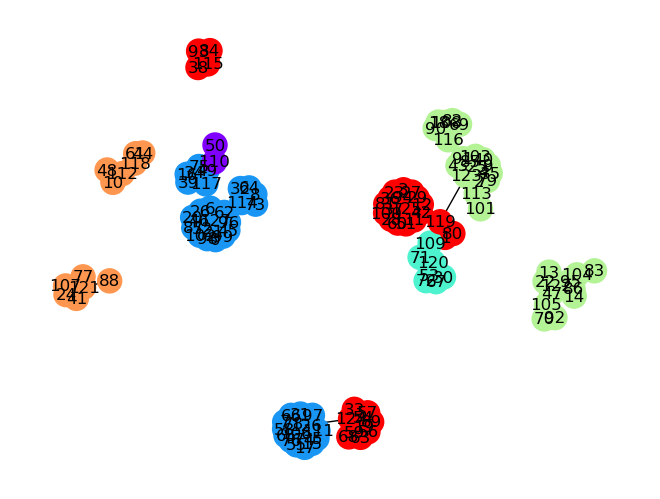

befor merge
0.7127586913462195


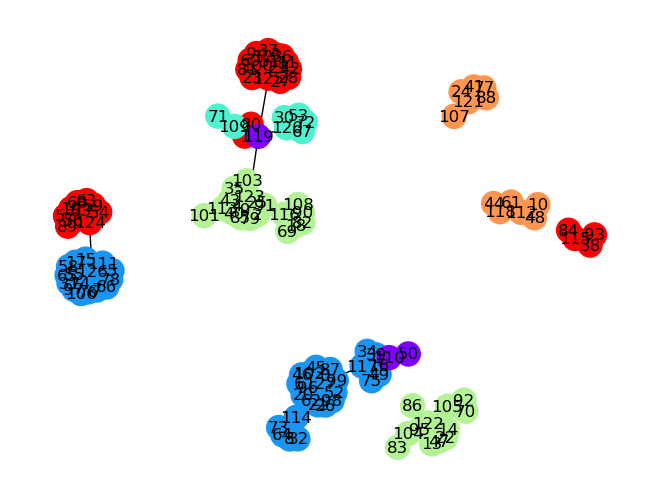

after merge
0.7255993443070827


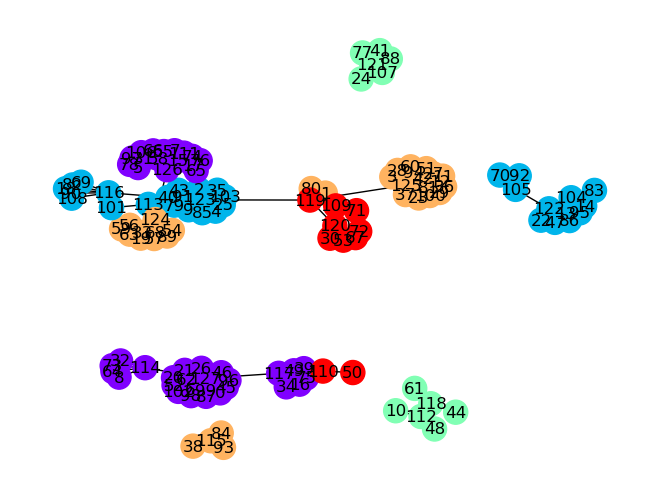

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 119 from Community 4 to Community 5
Moving node 117 from Community 3 to Community 2
i am in ls
befor merge
0.728331398128544


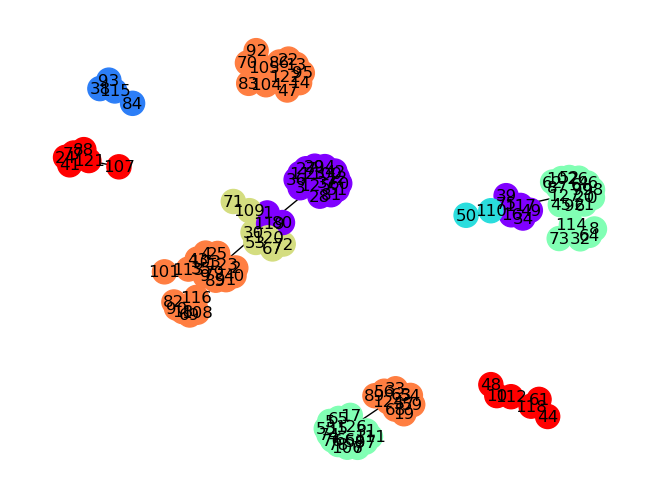

after merge
0.7313708080049184


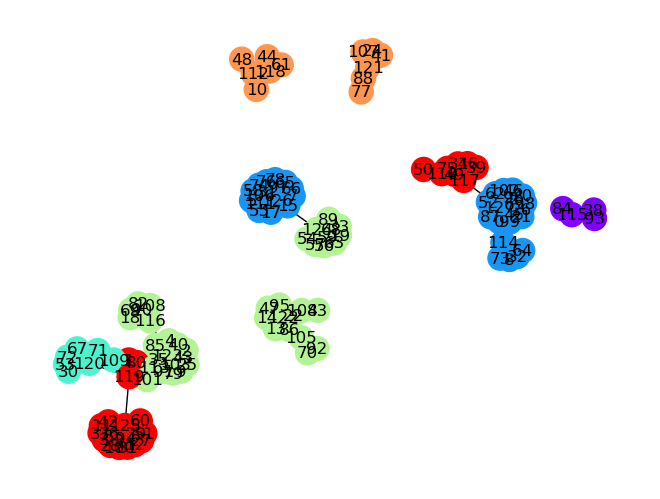

i am in ac
i am in permutation
Moving node 125 from Community 0 to Community 4
Moving node 123 from Community 5 to Community 4
No suitable community found for moving node 119
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 119 from Community 4 to Community 0
Moving node 117 from Community 3 to Community 2
Moving node 126 from Community 3 to Community 5
i am in ls
befor merge
0.7051772419916663


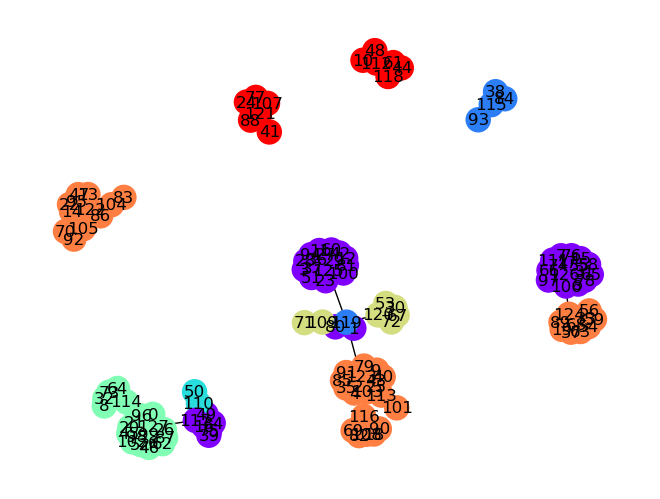

after merge
0.7056553514104211


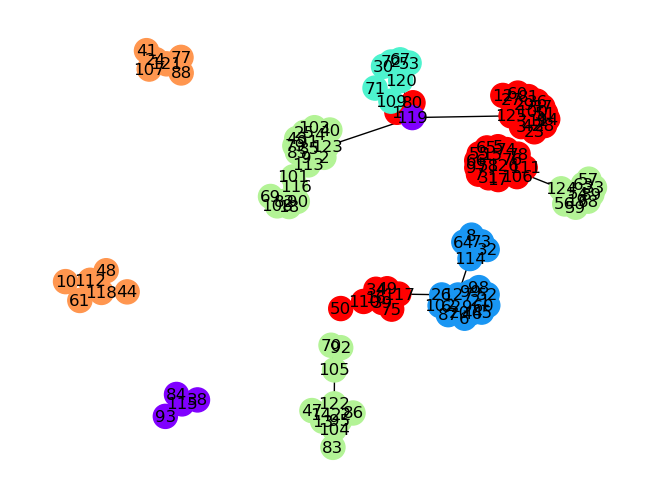

befor merge
0.7056553514104211


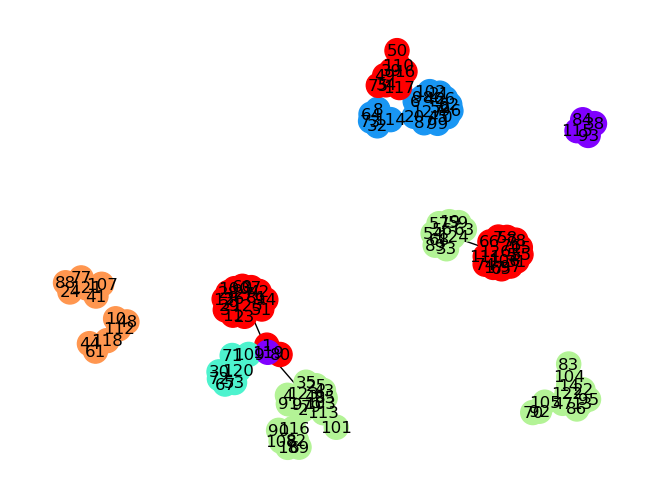

after merge
0.7172665801516274


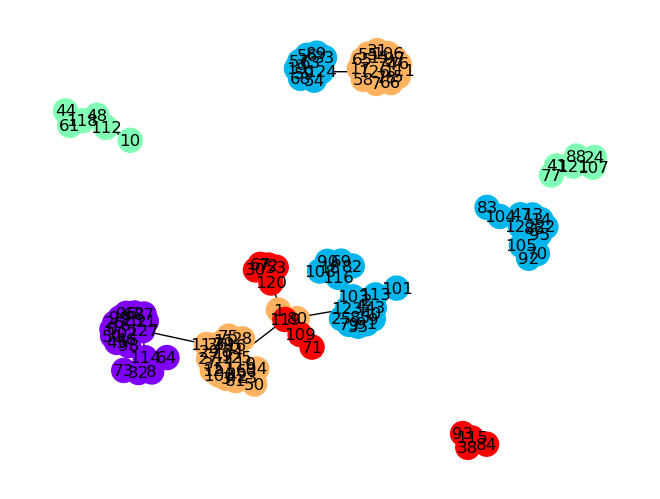

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 110 from Community 2 to Community 3
Moving node 124 from Community 5 to Community 3
Moving node 119 from Community 4 to Community 0
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 110 from Community 2 to Community 3
No suitable community found for moving node 117
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 117 from Community 3 to Community 2
Moving node 123 from Community 5 to Community 4
Moving node 119 from Community 4 to Community 0
i am in ls
befor merge
0.710299842906905


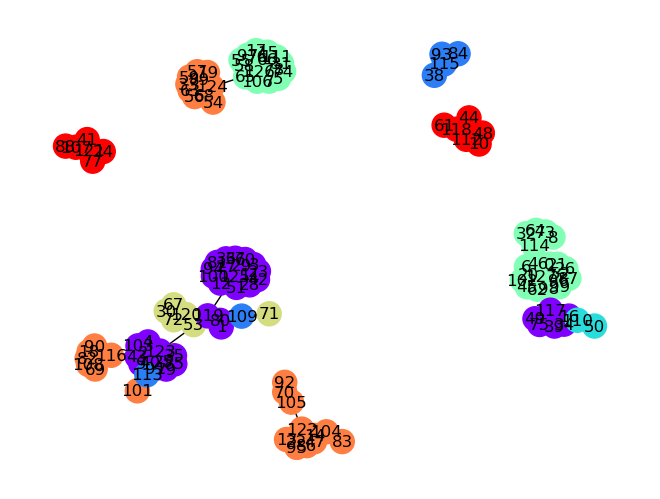

after merge
0.7107779523256599


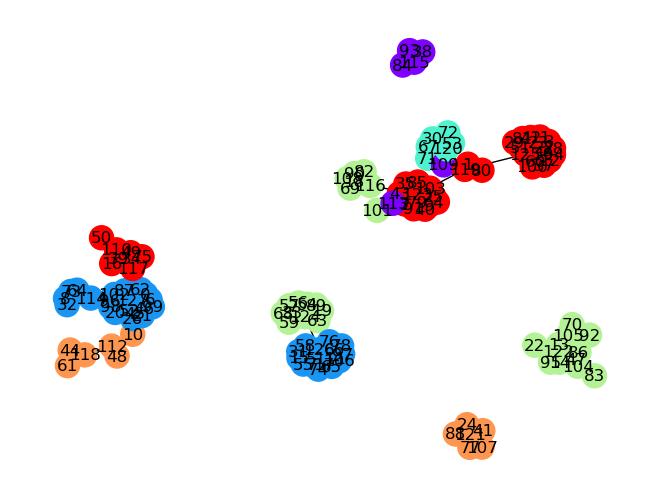

befor merge
0.7107779523256599


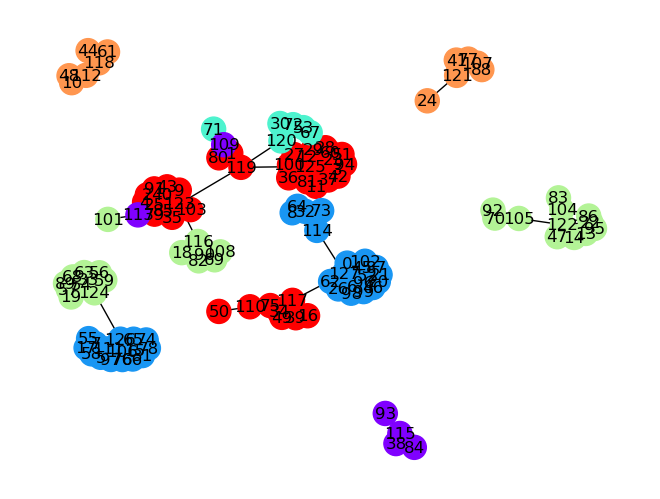

after merge
0.7156273478587521


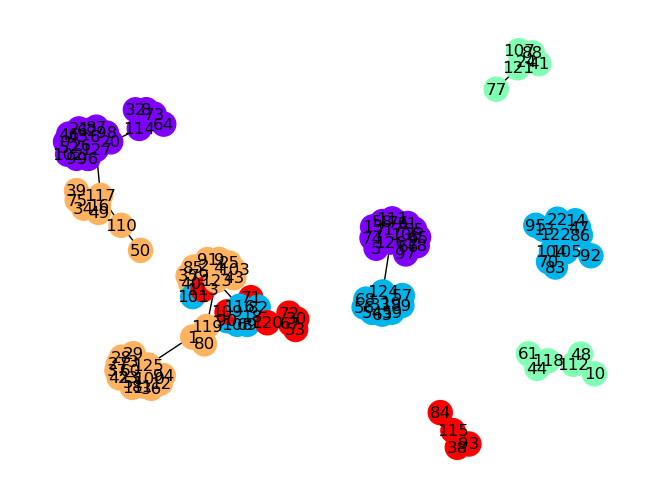

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 125 from Community 0 to Community 4
Moving node 119 from Community 4 to Community 5
i am in ls
i am in ac
i am in permutation
Moving node 126 from Community 3 to Community 5
Moving node 125 from Community 0 to Community 4
Moving node 123 from Community 5 to Community 4
i am in ls
befor merge
0.6675090499282808


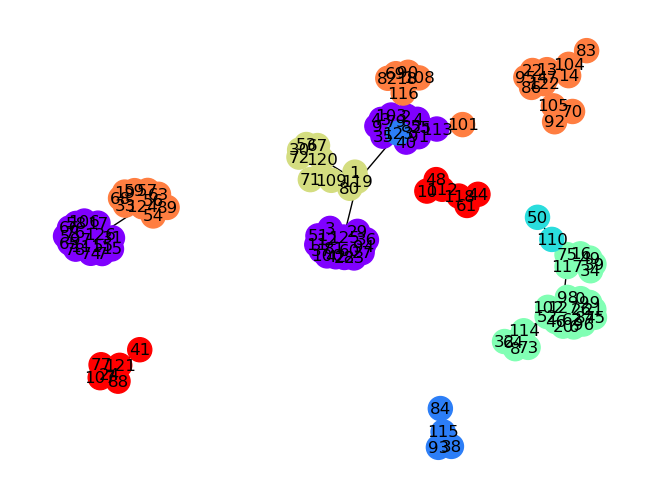

after merge
0.7154565944949117


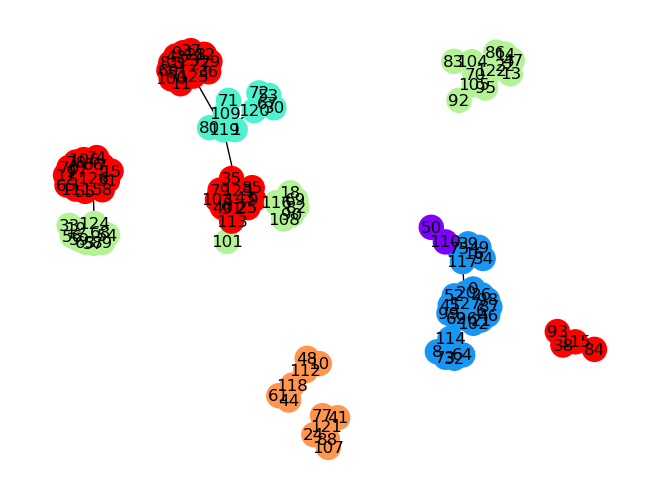

befor merge
0.7154565944949117


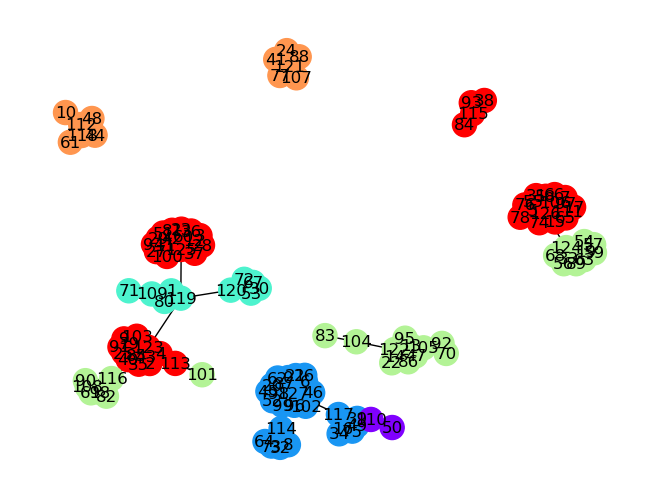

after merge
0.7184960043712856


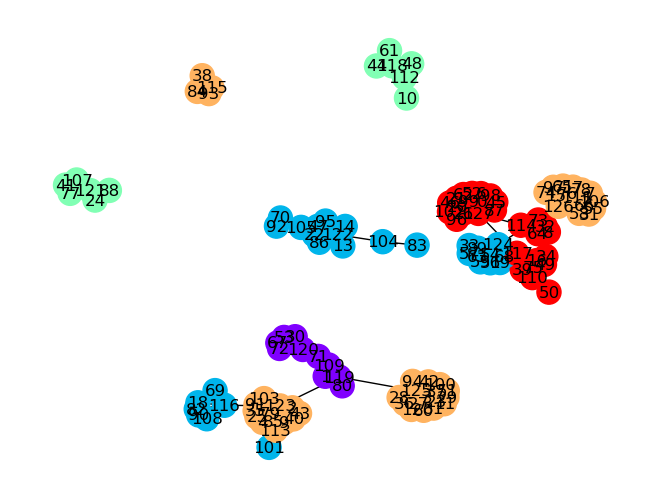

i am in ac
i am in permutation
i am in ls
befor merge
0.7108462536711966


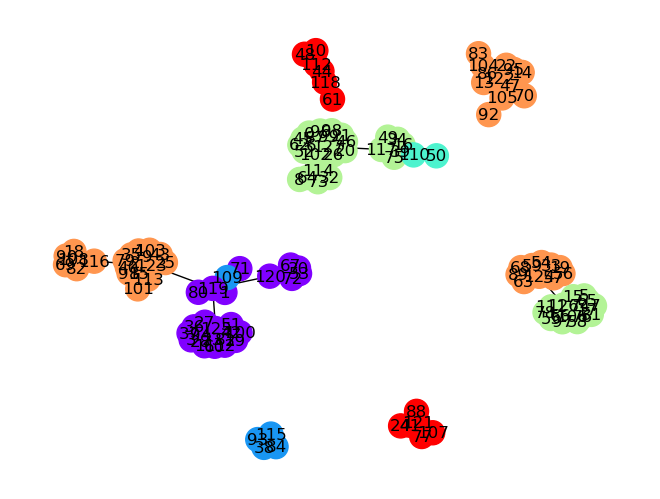

after merge
0.7139881155658758


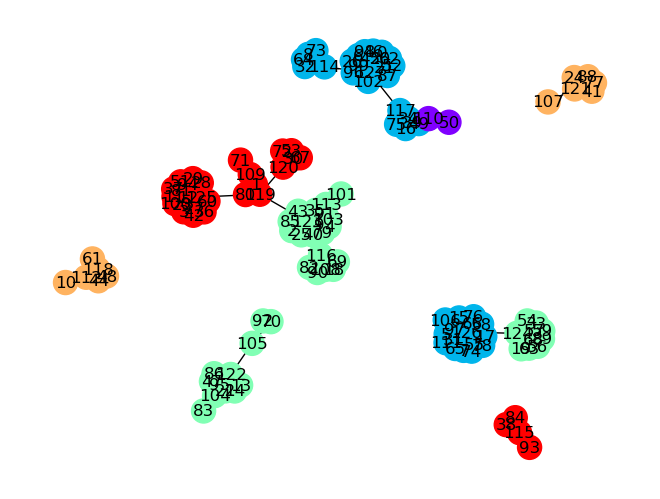

i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
No suitable community found for moving node 126
Moving node 125 from Community 0 to Community 4
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 110 from Community 2 to Community 3
Moving node 123 from Community 5 to Community 4
Moving node 124 from Community 5 to Community 3
i am in ls
befor merge
0.6471552489584008


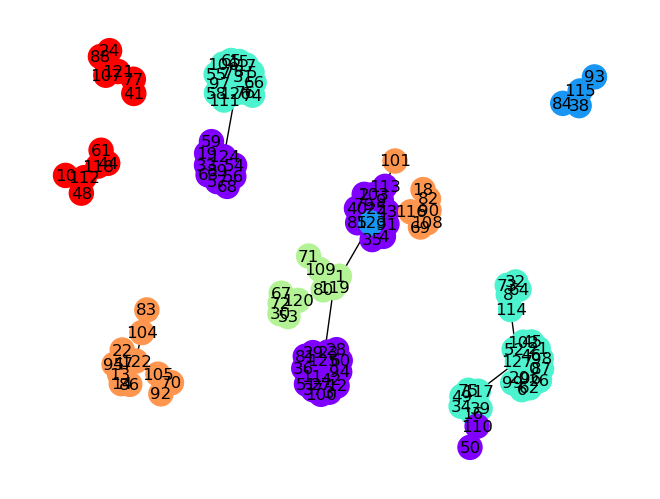

after merge
0.7012499146233171


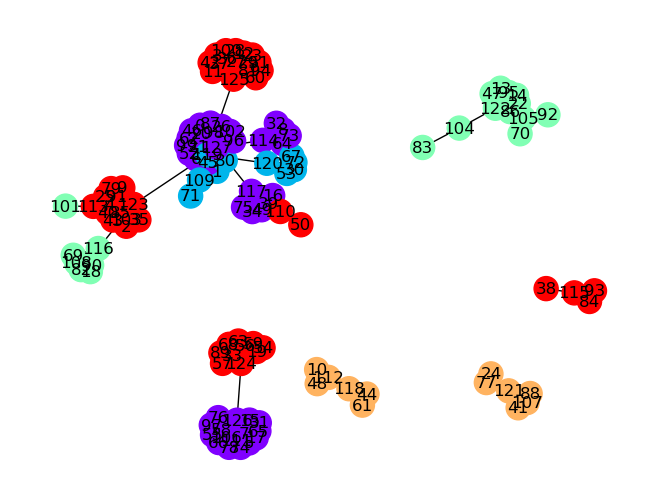

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 110 from Community 2 to Community 3
Moving node 119 from Community 4 to Community 0
i am in ls
befor merge
0.6732122122805788


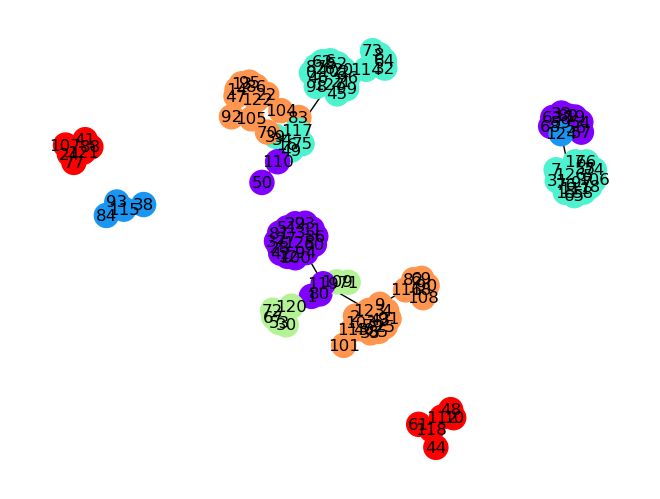

after merge
0.7197254285909431


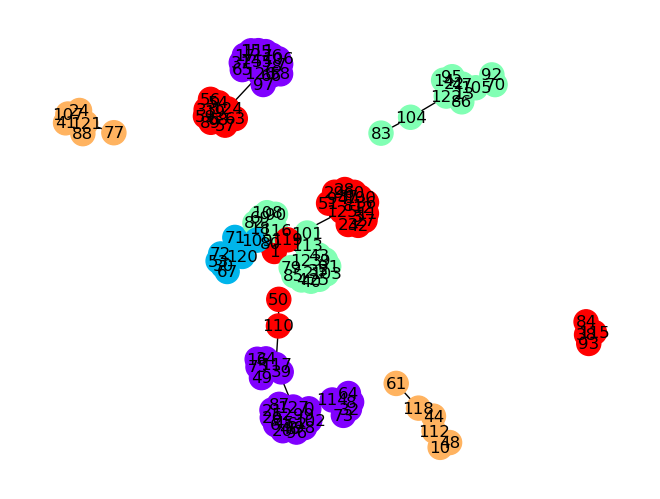

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
Moving node 124 from Community 5 to Community 3
Moving node 125 from Community 0 to Community 4
Moving node 119 from Community 4 to Community 5
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.6189467932518236


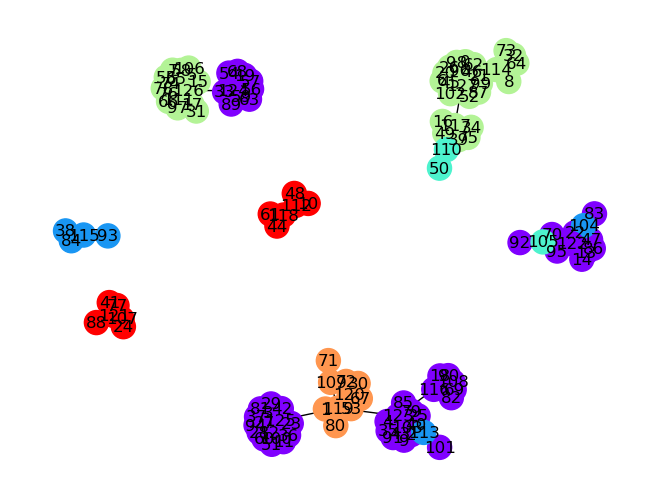

after merge
0.6224301618741853


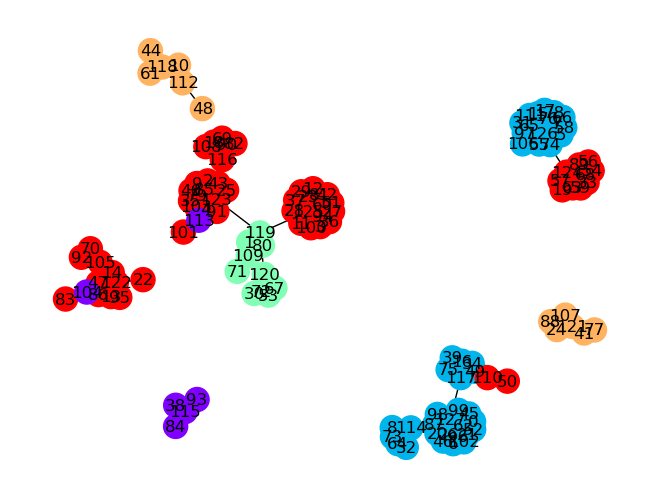

i am in ac
i am in permutation
i am in ls
i am in ac
i am in permutation
i am in ls
befor merge
0.7108462536711966


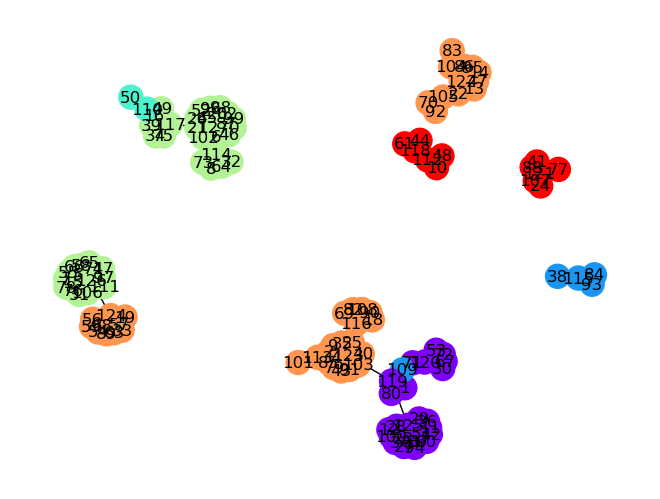

after merge
0.7139881155658758


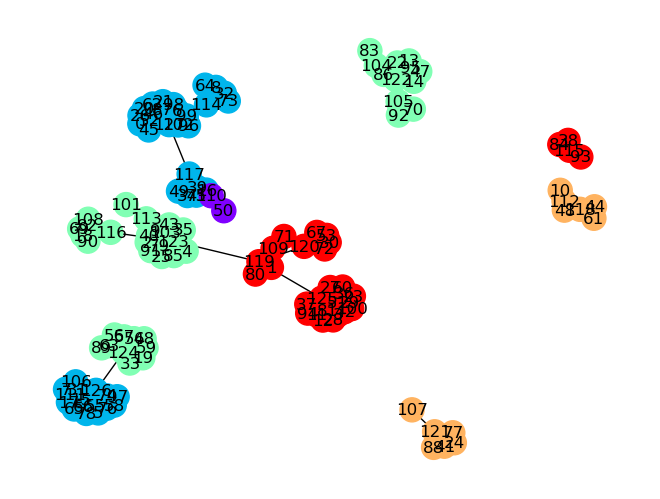

i am in ac


In [353]:

import networkx as nx
import numpy as np

def gml_to_adjacency_matrix(file_path):
    # Read the GML file into a networkx graph, using 'id' as the node label
    G = nx.read_gml(file_path, label='id')

    # Convert the graph to an adjacency matrix
    adjacency_matrix = nx.to_numpy_array(G)

    return adjacency_matrix

# Replace 'your_file.gml' with the actual path to your GML file
gml_file_path = 'C:/Users/slama/Downloads/0.15.gml'
adjacency_matrix = gml_to_adjacency_matrix(gml_file_path)

print("Adjacency Matrix:")
print(adjacency_matrix)

# If you want to use the ILS function, make sure it is defined and then call it
# ILS(adjacency_matrix)


# Print the adjacency matrix
print(adjacency_matrix)

best=ILS(adjacency_matrix)




0.737347175739363


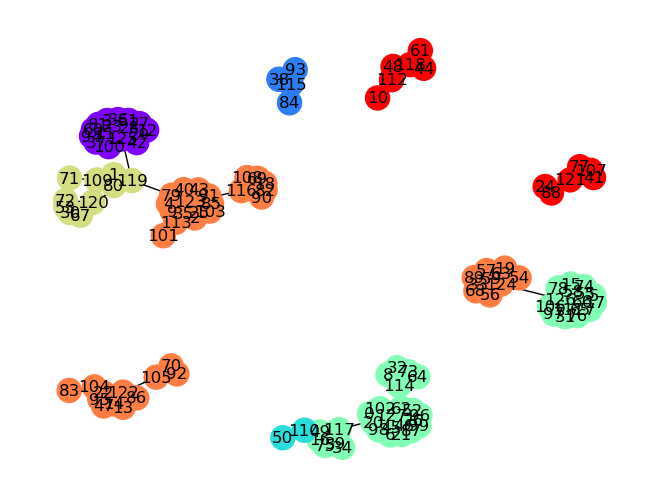

In [354]:
print(Modularity(adjacency_matrix,best,m))
plot_community_graph(adjacency_matrix, best)

In [357]:
from sklearn.metrics.cluster import normalized_mutual_info_score
import numpy as np



# Replace 'your_solution' with your actual solution list of lists
your_solution = best

# Replace 'ground_truth_file.dat' with your actual ground truth file path
ground_truth_file_path = 'C:/2SID/Projet_2cs/0.15/community.dat'




In [358]:
from sklearn.metrics.cluster import normalized_mutual_info_score
import numpy as np

def read_ground_truth_from_file(file_path):
    with open(file_path, 'r') as file:
        ground_truth_str = file.read()
    return [list(map(int, line.split())) for line in ground_truth_str.split('\n') if line]

def calculate_nmi(ground_truth, your_solution):
    ground_truth_dict = {node: community for community, nodes in enumerate(ground_truth, 1) for node in nodes}
    ground_truth_labels = np.array([ground_truth_dict.get(node, 0) for nodes in your_solution for node in nodes])
    your_solution_labels = np.concatenate([[i] * len(nodes) for i, nodes in enumerate(your_solution)])

    contingency_matrix = np.histogram2d(your_solution_labels, ground_truth_labels, bins=(len(your_solution), len(set(ground_truth_labels))))[0]

    nmi = normalized_mutual_info_score(your_solution_labels, ground_truth_labels)
    return nmi




# Read ground truth from file
ground_truth = read_ground_truth_from_file(ground_truth_file_path)

# Calculate NMI
nmi = calculate_nmi(ground_truth, your_solution)

print("Normalized Mutual Information (NMI):", nmi)


Normalized Mutual Information (NMI): 0.48834108398799647
